<h3>Imports and classes</h3>

In [151]:
#!/usr/bin/env python
# coding: utf-8
%matplotlib inline
import os
import sys
import warnings
import statistics
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from random import sample
import collections
from statistics import mean
from tqdm.notebook import tqdm

# Preprocessing
from sklearn.preprocessing import QuantileTransformer
from sklearn.decomposition import PCA
# Sklearn imports
from sklearn.utils import shuffle
from sklearn.model_selection import LeaveOneOut
from sklearn.model_selection import train_test_split


from sklearn.metrics import *

from sklearn.feature_selection import VarianceThreshold

# Different machine learning models from sklearn
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier

from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.datasets import make_moons, make_circles, make_classification
from sklearn.neural_network import MLPClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.linear_model import SGDClassifier
from sklearn.manifold import TSNE
from sklearn.metrics import average_precision_score

CWD = os.getcwd()
RANDOMSTATE = 42

class IuPred:
    '''
    Needs description.
    '''    
    def __init__(self, glob, short, long):
        self.glob = glob
        self.short = short
        self.long = long


class HydroPhobicIndex:
    '''
    Needs description.
    '''
    def __init__(self, hpilist):
        self.hpilist = hpilist

<h3>Functions</h3>

In [2]:
def preprocess_data(df, scaler):
    info = df.select_dtypes(include=['object'])
    y = df[instance]
    X = df.drop([instance], axis=1)
    X = X._get_numeric_data()
    columns = X.columns
    
    X = scaler.fit_transform(X)    
    X = pd.DataFrame(X, columns=columns)
    X[instance] = y
    X = X.merge(info, how='outer', left_index=True, right_index=True)    
    return X


def remove_correlating_features(df, cutoff=.95, plot=False):
    # Set matplotlib parameters
    sns.set(rc={'figure.figsize':(8,6)})
    plt.rcParams['pdf.fonttype'] = 42
    plt.rcParams['ps.fonttype'] = 42
    
    print('Correlation: Features before %s' % df.shape[1])
    
    # Create correlation matrix
    corr_matrix = df.corr().abs()

    # Select upper triangle of correlation matrix
    upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

    # Find index of feature columns with correlation greater than 0.95
    to_drop = [column for column in upper.columns if any(upper[column] > cutoff)]
    # Drop features
    df = df.drop(to_drop, axis=1)
    
    
    print('Correlation: Features after %s' % df.shape[1])
    if plot:
        # Plot heatmap
        sns.set(rc={'figure.figsize':(11.7,8.27)})
        sns.heatmap(data=df.corr(), cmap=sns.color_palette("coolwarm", 20), vmin=-1, vmax=1)
        plt.savefig(os.getcwd()+ '\\data\graphs\\6.Heatmap_after_correlation.pdf', transparent=True)
        plt.show()
    return df


def varianceSelection(df, threashold=.8):
    if not isinstance(df, pd.core.frame.DataFrame):
        logger.error('[%s] : [ERROR] Variance selection only possible on Dataframe not %s',
                                     datetime.fromtimestamp(time.time()).strftime('%Y-%m-%d %H:%M:%S'), type(df))
        sys.exit(1)
    sel = VarianceThreshold(threshold=(threashold * (1 - threashold)))
    sel.fit_transform(df)
    return df[[c for (s, c) in zip(sel.get_support(), df.columns.values) if s]]


def filter_low_variance(df, non_feature_columns, variance_cutoff=.8):
    df_variancetreshold = varianceSelection(df.drop(non_feature_columns, axis=1), variance_cutoff)
    for col in non_feature_columns:
        df_variancetreshold[col] = df[col]
    return df_variancetreshold


def remove_low_variance_features(df, variance_cutoff, plot=False):
    print('Low varience: Features before %s' % df.shape[1])
    non_feature_columns = ['protein_name', 'sequence', 'llps']
    df_variance = filter_low_variance(df, non_feature_columns, variance_cutoff)
    print('Low varience: Features after  %s' % df_variance.shape[1])
    
    # Set matplotlib parameters
    if plot:
        sns.set(rc={'figure.figsize':(8,6)})
        plt.rcParams['pdf.fonttype'] = 42
        plt.rcParams['ps.fonttype'] = 42

        # Plot heatmap
        sns.set(rc={'figure.figsize':(11.7,8.27)})
        sns.heatmap(data=df_variance.corr(), cmap=sns.color_palette("coolwarm", 20), vmin=-1, vmax=1)

        plt.savefig(os.getcwd()+ '\\data\graphs\\6.heatmap_after_low_variance.pdf', transparent=True)
        plt.show()
    return df_variance


def get_feature_importances(df, clf):
    '''
    Needs description.
    '''    
    fi = clf.feature_importances_
    fi = pd.DataFrame(fi).transpose()
    fi.columns = df.columns[1:]
    fi = fi.melt()
    fi = fi.sort_values('value', ascending=False)
    fi = fi.loc[fi['value'] > 0.0]
    return fi


def select_testing_data(df, instance, ratio=1, info_columns=['protein_name', 'sequence'], random=False):
    '''
    Class that equalizes the data based on the number of positives.
    :param df: dataframe with all the features and instance
    :param instance: string of instance columns
    :param ratio: ratio of how many negatives should be added (2 = twice as much negative)
    :param random: bool which gives a random test set with both instances randomly picked.
    :return: 'out' dataframe with new data, and 'df_info' dataframe with the information of 
    protein name and sequence.
    '''
    pos = df.loc[df[instance] == 1]
    neg_index = df.loc[df[instance] == 0].index
    negsubset_index = sample(set(neg_index), len(pos) * ratio)
    if random:
        possubset_index = sample(set(df.index), len(pos))
        negsubset_index = sample(set(df.index), len(pos))
        pos = df.loc[possubset_index]
        pos[instance] = pos[instance] = 1
    neg = df.loc[negsubset_index]
    out = pos.append(neg)
    out = out.reset_index(drop=True)
    df_info = out[info_columns]
    out = out.drop(labels=info_columns, axis=1)
    return out, df_info


def calculate_performance(clf, X_test, y_test):
    '''
    Needs description.
    '''    
    prediction = clf.predict(X_test)
    correctness = prediction == y_test
    distribution = correctness.value_counts(True)
    return distribution


def train_model(data, clf, instance):
    df, df_info = select_testing_data(data, instance, ratio=1, random=False)
    X_train, X_test, y_train, y_test = train_test_split(df.drop(instance, axis=1),
                                                        df[instance],
                                                        test_size=0.5,
                                                        random_state=RANDOMSTATE,
                                                        )
    clf = clf.fit(X_train, y_train)
    return clf, X_test, y_test

    
def plot_pca(df, title='', analysis_name=''):
    # Set matplotlib parameters
    sns.set(rc={'figure.figsize':(8,6)})
    plt.rcParams['pdf.fonttype'] = 42
    plt.rcParams['ps.fonttype'] = 42
    
    
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(df.drop(['sequence', 'protein_name'],axis=1))
    pca_df = pd.DataFrame(X_pca, columns=['component1', 'component2'])
    pca_df['protein_name'] = df['protein_name']
    pca_df['llps'] = df.reset_index()['llps']


    sns.scatterplot(data=pca_df.loc[pca_df['llps'] == 0],
                    x = 'component1',
                    y = 'component2',
                    alpha = .5,
                    color = '#AEB6BF',
                    rasterized=True,
                   )
    sns.scatterplot(data=pca_df.loc[pca_df['llps'] == 1],
                    x = 'component1',
                    y = 'component2',
                    alpha = 1,
                    color = '#CD6155',                
                   )
    
    
    # print(pca_df.loc[(pca_df['llps'] == 1) & (pca_df['component1'] >= 650)])
    
    plt.ylabel('Component1 (' + str(round(pca.explained_variance_ratio_[0] * 100, 2)) + '%)')
    plt.xlabel('Component2 (' + str(round(pca.explained_variance_ratio_[1] * 100, 2)) + '%)')
    plt.title(title)
    plt.savefig(os.getcwd()+ f'\\analysis\\{analysis_name}\\PCA_plot.pdf', transparent=True)
    plt.show()


def average(l):
    return sum(l) / len(l)

<h1>1. Data processing and feature selection </h1>

In [136]:
def preprocess_and_scaledata(data, instance):
    try:
        data = data.drop(['iupred', 'HydroPhobicIndex', 'uniprot_id', 'PRDaa'], axis=1)
    except KeyError:
        data = data.drop(['iupred', 'HydroPhobicIndex', 'uniprot_id'], axis=1)
    data = data.fillna(value=0)
    print(data.shape)
    print('Number of phase separating proteins in dataset: '+str(data.loc[data[instance] == 1].shape[0]))
    print(data.shape)
    
    # scaler = QuantileTransformer(output_distribution='normal')
    scaler = QuantileTransformer()
    df = data.copy()
    processed_data = df.fillna(0)
    processed_data = preprocess_data(processed_data, scaler)
    #processed_data = remove_correlating_features(processed_data, cutoff=.95)
    #processed_data = remove_low_variance_features(processed_data, variance_cutoff=0.08)
    return processed_data

In [139]:
path = 'data/Dataframes/human_90_240320.with_domain.pkl'
data = pd.read_pickle(path)
instance = 'llps'
data = data.loc[(data['length'] >= 100) & (data['length'] <= 3000)]
data = data.reset_index(drop=True)
domain_cols = data.columns[data.columns.str.contains("^domain")]
domain_data = data[domain_cols]
data.drop(columns=domain_cols)
data = preprocess_and_scaledata(data, instance)

(19608, 99)
Number of phase separating proteins in dataset: 90
(19608, 99)


In [141]:
domain_data

,domain RNA Binding,domain Zinc finger,domain Other
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0
...,...,...,...
19603,0,0,0
19604,0,0,0
19605,0,0,0
19606,0,0,0


# Test method

In [5]:
class EnsembleRandomForest:
    def __init__(self):
        self.estimators = list()

    def fit(self, data, index_list, label):
        estimators=list()   
        non_numeric_columns = (list(data.select_dtypes(include='object')))
        data = data.select_dtypes([np.number])
        for index in tqdm(index_list):
            df = data.loc[index]
            X = df.drop(instance, axis=1)
            y = df[label]
            clf = RandomForestClassifier()
            clf.fit(X, y)
            estimators.append(clf)
        self.estimators = estimators

    def predict_proba(self, df, label):
        probabilities = list()
        for clf in self.estimators:
            probability = clf.predict_proba(df)[:,1]
            probabilities.append(probability)
        probabilities = np.array(probabilities)
        predictions = list()
        for i in range(probabilities.shape[1]):
            prediction = np.average(probabilities[:,i])
            predictions.append(prediction)
        return predictions

In [6]:
def split_dataframe_data(data, label, n=30, n_negative=30):
    positive_label_sample = data[data[label] == 1].sample(n)
    negative_label_sample = data[data[label] == 0].sample(n_negative)
    train_data = data.drop(list(positive_label_sample.index))
    train_data = train_data.drop(list(negative_label_sample.index))
    test_data = shuffle(positive_label_sample.append(negative_label_sample)).reset_index(drop=True)      
    return train_data, test_data,

### K-Fold cross validation

Updated: 
* Now uses `StratifiedKfold` for better selection of positives/negatives per fold.
* 10-fold cross-validation.


In [7]:
from sklearn.model_selection import StratifiedKFold

In [9]:
label = 'llps'
data_filtered = data.select_dtypes([np.number])
X = data_filtered.drop(label, axis=1)
y = data_filtered[label]
kf = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

0.8745
0.8234
0.9225
0.8357
0.8619
0.9563
0.9115
0.8026
0.8215
0.9452



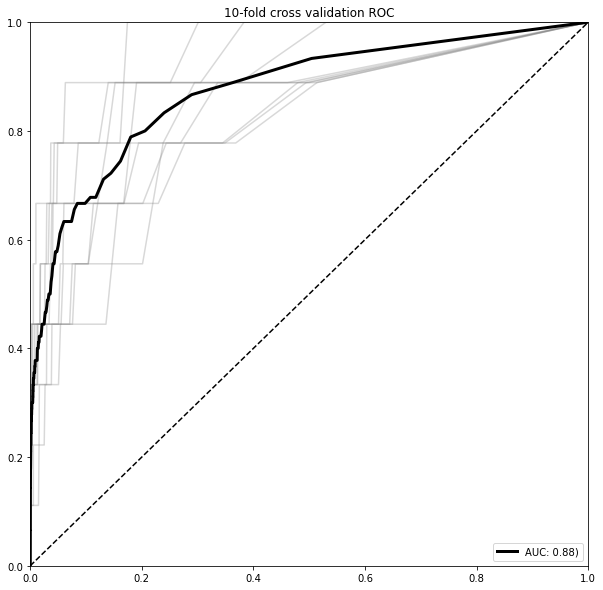

In [193]:
clf = RandomForestClassifier(n_jobs=32, class_weight="balanced", n_estimators=1200, criterion="entropy")
#clf = XGBClassifier(n_jobs=24, scale_pos_weight)
all_y_test = list()
all_y_proba = list()
all_idx = list()
plt.figure(figsize=(10, 10))
ax = plt.subplot(111)  
all_aucs = []
for i, (train_index, test_index) in tqdm(enumerate(kf.split(X, y)), total=kf.n_splits):
    all_idx.extend(test_index)
    # print("TRAIN:", train_index, "TEST:", test_index)
    X_train, X_test = X.loc[train_index], X.loc[test_index]
    y_train, y_test = y.loc[train_index], y.loc[test_index]
    #print(y_train.head())
    clf.fit(X_train, y_train)
    y_proba = clf.predict_proba(X_test)[:,1]
    # scores individual
    fpr, tpr, _ = roc_curve(y_test, y_proba)
     
    
    all_y_test.extend(y_test)
    all_y_proba.extend(y_proba)
    
    roc_auc = auc(fpr, tpr)
    print(f"Fold {i + 1} ROC AUC: {roc_auc:.4f}")
    all_aucs.append(roc_auc)
  
    plt.plot(fpr, tpr, color="grey", alpha=0.3)
        
fpr, tpr, _ = roc_curve(all_y_test, all_y_proba)
    
roc_auc = auc(fpr, tpr)
plt.plot(fpr, tpr, label=f'AUC: {roc_auc:.2f})', color="black", lw=3)

plt.title(f'{kf.n_splits}-fold cross validation ROC')    
plt.plot([0, 1], [0, 1], 'k--')
ax.legend(loc="lower right")
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.show()

#print("Mean AUC", np.mean(all_aucs))

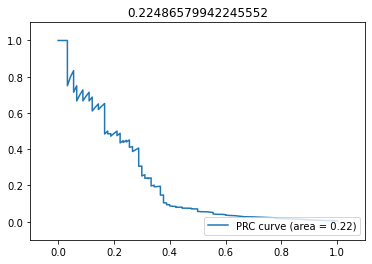

In [91]:
ax = plt.subplot(111)
average_precision = average_precision_score(all_y_test, all_y_proba)
precision, recall, _ = precision_recall_curve(all_y_test, all_y_proba)

plt.title('Precision Recall Curve')
ax.plot(recall, precision, label=f'PRC curve (area = {round(average_precision,2)})')
plt.title(str(average_precision))

plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
ax.legend(loc="lower right")


# Analysis domain delta

All left out domain sets are compared to 100 random samples.

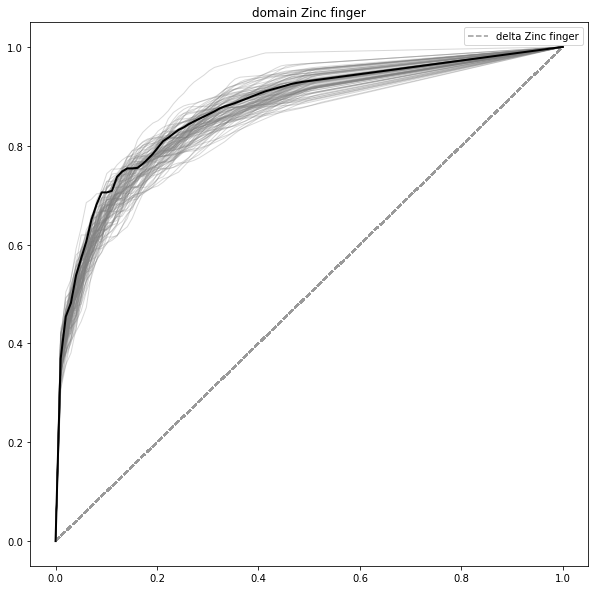

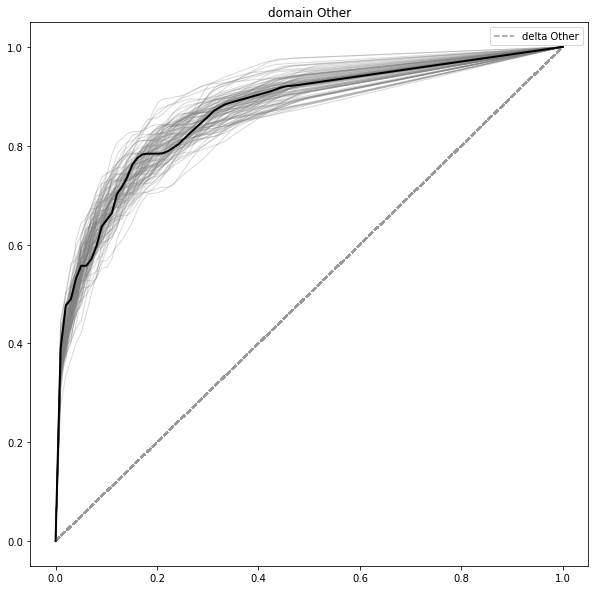

In [198]:
N_SAMPLE = 100

for domain in domain_data.columns[1:]:

    clf = RandomForestClassifier(n_jobs=32, class_weight="balanced", n_estimators=1200, criterion="entropy")
    plt.figure(figsize=(10, 10))
    mean_aucs = []
    n_remove = ((y == 1) & (domain_data[domain] == 1)).sum()
    for c in tqdm(range(N_SAMPLE)):
        # Randomly remove positives
        idx = ~y.index.isin(y[y==1].sample(n_remove).index)
        my_y = y.loc[idx]
        my_X = X.loc[idx]
        mean_tpr = 0.0
        mean_fpr = np.linspace(0, 1, 100)
        all_tpr = []
        for i,(train_index, test_index) in enumerate(kf.split(my_X, my_y)):
            y_proba = clf.fit(my_X.iloc[train_index], my_y.iloc[train_index]).predict_proba(my_X.iloc[test_index])[:,1]

            fpr, tpr, thresholds = roc_curve(my_y.iloc[test_index], y_proba)
            mean_tpr += np.interp(mean_fpr, fpr, tpr)
            mean_tpr[0] = 0.0
            #roc_auc = auc(fpr, tpr)
            #plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

        plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6))

        mean_tpr /= kf.n_splits
        mean_tpr[-1] = 1.0
        mean_auc = auc(mean_fpr, mean_tpr)
        mean_aucs.append(mean_auc)
        plt.plot(mean_fpr, mean_tpr, lw=1, color="grey", alpha=0.3)

    idx = y.index[(domain_data[domain] == 0) | (y == 0)]
    my_y = y.loc[idx]
    my_X = X.loc[idx]
    mean_tpr = 0.0
    mean_fpr = np.linspace(0, 1, 100)
    all_tpr = []
    for i,(train_index, test_index) in enumerate(kf.split(my_X, my_y)):
        y_proba = clf.fit(my_X.iloc[train_index], my_y.iloc[train_index]).predict_proba(my_X.iloc[test_index])[:,1]

        fpr, tpr, thresholds = roc_curve(my_y.iloc[test_index], y_proba)
        mean_tpr += np.interp(mean_fpr, fpr, tpr)
        mean_tpr[0] = 0.0
        #roc_auc = auc(fpr, tpr)
        #plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

    plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label=f"delta {domain.replace('domain ', '')}")

    mean_tpr /= kf.n_splits
    mean_tpr[-1] = 1.0
    mean_auc = auc(mean_fpr, mean_tpr)
    plt.plot(mean_fpr, mean_tpr, lw=2, color="black")
    plt.legend()
    plt.title(domain)
    plt.savefig(f"{domain.replace(' ', '_')}.roc.png", dpi=300)

# Compare P-score predictor

Comparison to Vernon et al. 2018 (https://elifesciences.org/articles/31486).

In [92]:
uniprot_ids = '''
Q99700
O60885
Q14781
P45973
P38432
Q7Z5Q1
O00571
Q9NQI0
O43781
Q04637
Q15056
P15502
Q01844
P22087
Q06787
P35637
Q13283
Q9UN86
P10071
P62993
Q13151
P09651
Q32P51
P22626
P51991
O14979
P31943
P55795
P31942
O43561
P10636
P43243
Q15648
P19338
P06748
Q15233
P52948
Q01860
P11940
P29590
Q8WXF1
Q96PK6
P98179
P23246
Q16637
P00441
Q07889
P23497
Q07955
Q01130
O95793
O75683
Q92804
Q13148
Q15554
P31483
Q01085
Q9UHD9
P46937
Q15059
P10644
P54727
Q13501
Q9NPI6
O00444
Q53HL2
Q9ULW0
Q9Y6A5
Q96LT7
P06748
Q16236
O43823
Q07157
Q9UDY2
O95049
Q9Y6M1
Q6NT89
Q8NC56
P04150
Q9BYJ9
Q9Y5A9
Q7Z739
P10997
Q9GZV5
P51608
O14979
P43351
Q08379
P08621
Q15424
Q16630
P18615
P48443
'''

uniprot_ids = uniprot_ids.strip().split("\n")

In [93]:
pscore_file = "SourceCodeS2/pscore.out"
pscore = pd.read_table(pscore_file, sep=" +", usecols=[1,2], names=["score", "protein_id"])
pscore["uniprot_id"] = pscore["protein_id"].str.split("|", expand=True)[1]
pscore["llps"] = pscore["uniprot_id"].isin(uniprot_ids)


/vol/mbconda/heeringen/envs/scepia/lib/python3.8/site-packages/pandas/io/parsers.py:765: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  return read_csv(**locals())


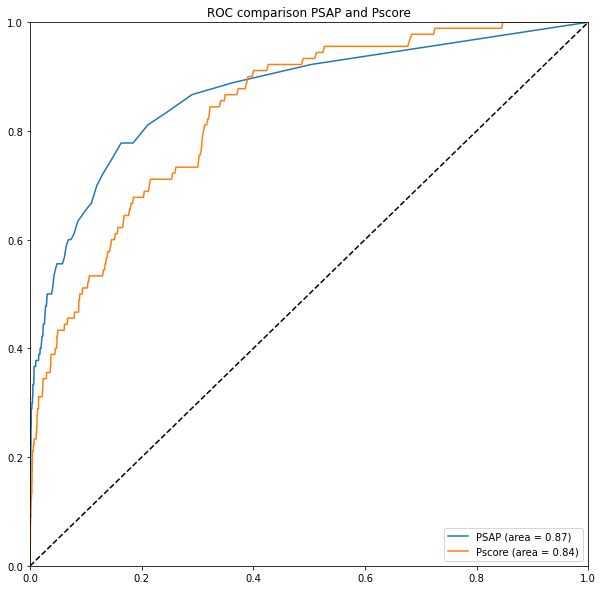

In [94]:
fpr, tpr, _ = roc_curve(all_y_test, all_y_proba)
fpr_pscore, tpr_pscore, _ = roc_curve(pscore["llps"], pscore["score"])


roc_auc = auc(fpr, tpr)
roc_auc_pscore = auc(fpr_pscore, tpr_pscore)
plt.figure(figsize=(10, 10))
ax = plt.subplot(111) 

plt.plot(fpr, tpr, label=f'PSAP (area = {roc_auc:.2f})')
plt.plot(fpr_pscore, tpr_pscore, label=f'Pscore (area = {roc_auc_pscore:.2f})')

plt.title('ROC comparison PSAP and Pscore')
ax.legend(loc="lower right")
plt.xlim([0, 1])
plt.ylim([0, 1])


plt.plot([0, 1], [0, 1], 'k--')
plt.show()

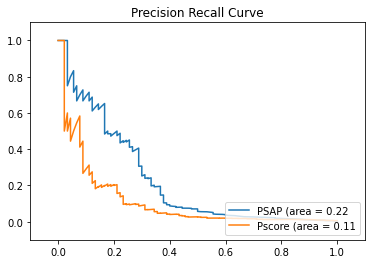

In [95]:
ax = plt.subplot(111)
average_precision = average_precision_score(all_y_test, all_y_proba)
precision, recall, _ = precision_recall_curve(all_y_test, all_y_proba)

average_precision_pscore = average_precision_score(pscore["llps"], pscore["score"])
precision_pscore, recall_pscore, _ = precision_recall_curve(pscore["llps"], pscore["score"])

plt.title('Precision Recall Curve')
ax.plot(recall, precision, label=f'PSAP (area = {average_precision:.2f}')
ax.plot(recall_pscore, precision_pscore, label=f'Pscore (area = {average_precision_pscore:.2f}')

plt.xlim([-0.1, 1.1])
plt.ylim([-0.1, 1.1])
ax.legend(loc="lower right")


# Train final model

And predict values for complete proteome.

In [105]:
clf = RandomForestClassifier(n_jobs=32, class_weight="balanced", n_estimators=1200, criterion="entropy", random_state=42)
clf.fit(X, y)
psap_prediction = pd.DataFrame(index=data["protein_name"])
psap_prediction["PSAP_score"] = clf.predict_proba(X)[:,1]

psap_prediction["llps"] = y.values
psap_prediction["rank"] = 0  
rank = psap_prediction.loc[psap_prediction["llps"] == 0, "PSAP_score"].rank(ascending=False)
psap_prediction["rank"] = rank

In [128]:
psap_prediction.loc[["FXR2_HUMAN", "ILF3_HUMAN", "YBOX1_HUMAN", "THOC4_HUMAN", "TFG_HUMAN"]]

,PSAP_score,PSAP_crossval_score,llps,rank
protein_name,,,,
FXR2_HUMAN,0.077500,0.000000,0,11.0
ILF3_HUMAN,0.051667,0.001667,0,30.0
YBOX1_HUMAN,0.053333,0.000000,0,28.0
THOC4_HUMAN,0.065000,0.000833,0,15.0
TFG_HUMAN,0.030000,0.001667,0,99.5


In [130]:
psap_prediction.loc[["GORS1_HUMAN", "TCPB_HUMAN", "NRG4_HUMAN", "LIMK2_HUMAN", "MYO1C_HUMAN"]]

,PSAP_score,PSAP_crossval_score,llps,rank
protein_name,,,,
GORS1_HUMAN,0.017500,0.0025,0,249.5
TCPB_HUMAN,0.003333,0.0000,0,2100.5
NRG4_HUMAN,0.000000,0.0000,0,13286.5
LIMK2_HUMAN,0.000000,0.0000,0,13286.5
MYO1C_HUMAN,0.000000,0.0000,0,13286.5


<h1>2 Data visualization</h1>

In [8]:
def get_test_train_indexes(data, label , ratio=1, randomized=False):
    '''
    Function: Will oversample the positive data with randomly selected negative samples.
    Returns: List with indexes which contain positive and negative samples.
    '''
    positive_instances = set(data.loc[data[label] == 1].index)
    negative_instances = set(data.loc[data[label] == 0].index)
    n_positives = data.loc[data[label] == 1].shape[0]    
    indexes = list()    
    while len(negative_instances) >= 1:    
        if len(negative_instances) > n_positives * ratio:
            sample_set = sample(negative_instances, (n_positives * ratio))
        else:
            sample_set = list(negative_instances)
            size = (len(sample_set))
            short = (len(positive_instances ) * ratio) - size        
            shortage = sample(set(data.loc[data[label] == 0].index), short)
            sample_set = (sample_set+ shortage)
        indexes.append((list(positive_instances) + list(sample_set)))
        negative_instances.difference_update(set(sample_set))
    return(indexes)


def evaluate_model(data, label, index_list, names, classifiers, testing_size, randomize=False):
    evaluations=dict()
    for name, clf in zip(names, classifiers):   
        scores=list()   
        non_numeric_columns = (list(data.select_dtypes(include='object')))
        data = data.select_dtypes([np.number])
        print(f'Now training: {name}')
        for index in tqdm(index_list):
            # Get index values.
            df = data.loc[index]
            
            # Randomize
            if randomize:
                pass
                
            # Specify data and labels.
            X = df.drop(instance, axis=1)
            y = df[label]

            # split data and train model.
            X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=testing_size)
            clf.fit(X_train, y_train)

            # get predictions
            y_pred = clf.predict(X_test)
            y_proba = clf.predict_proba(X_test)
            scores.append([list(y_test), y_pred, y_proba])        
        evaluations[name] = scores        
    return evaluations


def get_model_evaluations(processed_data, ratio=1, testing_size=.1, label='llps'):
    names = [
        "Random Forest",
        "Gradient Boosting",
        "Extra Trees",
        "Decision Tree",
        "KNeighbors",
        "C-Support Vector",
        "Gaussian Process",
        "Neural Net",
        "AdaBoost",
        "Gaussian Naive Bayes",
    ]

    classifiers = [
        RandomForestClassifier(),
        GradientBoostingClassifier(),
        ExtraTreesClassifier(),
        DecisionTreeClassifier(),
        KNeighborsClassifier(),
        SVC(probability=True),
        GaussianProcessClassifier(1.0 * RBF(1.0), max_iter_predict=100),
        MLPClassifier(),
        AdaBoostClassifier(),
        GaussianNB(),
    ]

    data = processed_data.copy()
    index_list = get_test_train_indexes(data, label, ratio=1)

    # evaluate models.
    evaluations = evaluate_model(data, label, index_list, names, classifiers, testing_size)
    return evaluations

In [121]:
label = 'llps'
x_data, y_data = split_dataframe_data(data, label, n=30)
index_list = get_test_train_indexes(x_data, label)
estimators = fit_classifiers(x_data, index_list, label)
y_score = decision_function(estimators, y_data, label)
get_auc_score(y_data, y_score)

0.5488888888888889

0.8755555555555555

<h3>3.1 Model selection</h3>

In [5]:
def get_classififier_scores(evaluations):
    metric_df = pd.DataFrame(columns=[
        'Classifier',
        'Accuracy',
        'F1',
        'ROC AUC',
        'Precision',
        'Recall',
        'PRC AUC'])

    for clf_name in evaluations.keys():    
        mean_accuracy = list()
        mean_f1 = list()
        mean_prc_auc = list()
        mean_precision_score = list()
        mean_recall_score = list()
        mean_roc_auc = list()


        scores = evaluations[clf_name]
        for score in scores:
            y_test = score[0]
            y_pred = score[1]
            y_proba = score[2]
            y_proba = y_proba[:, 1]
            # Calculate metrix
            mean_accuracy.append(accuracy_score(y_test, y_pred))
            mean_f1.append(f1_score(y_test, y_pred)) 
            mean_precision_score.append(precision_score(y_test, y_pred))
            mean_recall_score.append(recall_score(y_test, y_pred))        
            roc_auc = roc_auc_score(y_test, y_proba)
            mean_roc_auc.append(roc_auc)
            fpr, tpr, thresholds = roc_curve(y_test, y_proba)
            roc_auc = auc(fpr, tpr)
            mean_roc_auc.append(roc_auc)
            precision, recall, _ = precision_recall_curve(y_test, y_proba)
            prc_auc_score = auc(recall, precision)
            mean_prc_auc.append(prc_auc_score)

        # Get mean metric from each model
        mean_accuracy = statistics.mean(mean_accuracy)
        mean_f1 = statistics.mean(mean_f1)
        mean_precision_score = statistics.mean(mean_precision_score)
        mean_recall_score = statistics.mean(mean_recall_score)    
        mean_roc_auc = statistics.mean(mean_roc_auc)
        mean_prc_auc = statistics.mean(mean_prc_auc)

        metric_df = metric_df.append(
            {
                'Classifier': clf_name,
                'Accuracy': mean_accuracy,
                'F1': mean_f1,
                'ROC AUC': mean_roc_auc,
                'Precision': mean_precision_score,
                'Recall': mean_recall_score,
                'PRC AUC': mean_prc_auc,
            },
            ignore_index=True
        )
    return metric_df


In [6]:
def plot_heatmap(metric_df, analysis_name=''):
    # Plot heatmap machine learning alrgorithm performances.
    # Set matplotlib parameters
    sns.set(rc={'figure.figsize':(8,6)})
    plt.rcParams['pdf.fonttype'] = 42
    plt.rcParams['ps.fonttype'] = 42

    sns.heatmap(metric_df.set_index('Classifier').sort_values('PRC AUC', ascending=False).round(2),
                annot=True,
                cmap=sns.color_palette("Reds", 20),
                vmin=.76, 
                vmax=1)

    plt.savefig(CWD+f'\\analysis\\{analysis_name}\\6.Classifier_score_heatmap.pdf', transparent=True)
    plt.show()

In [7]:
def calculate_curves(evaluations, evaluation_type = 'ROC', analysis_name=''):
    aggegrate = list()
    
    for clf_name in evaluations.keys():   
        with sns.axes_style("white"):
            sns.despine()
            plt.figure()    
            fpr_list = list()
            tpr_list = list()
            scores = evaluations[clf_name]
            for score in scores:
                y_test = score[0]
                y_pred = score[1]
                y_proba = score[2]
                y_proba = y_proba[:, 1]
                if evaluation_type == 'ROC':
                    fpr, tpr, _ = roc_curve(y_test, y_proba)
                elif evaluation_type == 'PRC':
                    fpr, tpr, _ = precision_recall_curve(y_test, y_proba)
                else:
                    print(f'Evaluation type {evaluation_type} not found. Please use "ROC" or "PRC"')
                fpr_list.append(fpr)
                tpr_list.append(tpr) 
                
                # Plot
                lw = 2
                if evaluation_type == 'ROC':
                    plt.plot(fpr, tpr, color='#050505',  alpha=0.1)
                elif evaluation_type == 'PRC':
                    plt.plot(tpr, fpr, color='#050505',  alpha=0.1)
                else:
                    pass
            # Plot the rest of the plot
            plt.xlim([0.0, 1.0])
            plt.ylim([0.0, 1.00])
            if evaluation_type == 'ROC':
                plt.xlabel('False Positive Rate')
                plt.ylabel('True Positive Rate')
                plt.title(f'Receiver operating characteristic: {clf_name}')
            elif evaluation_type == 'PRC':
                plt.xlabel('Recall')
                plt.ylabel('Precision')
                plt.title(f'Precision recall curve: {clf_name}')
            else:
                pass
            
            # Aggegrate from interpolated ROC curves
            stepsize = 0.01
            roc_polated = list()
            for fpr, tpr in zip(fpr_list, tpr_list):
                iteplt = np.interp(np.arange(0,1,.01), fpr, tpr)
                roc_polated.append(list(iteplt))
            np.array(roc_polated)
            roc_agg = []
            for j in range(100):
                roc_agg.append(mean([i[j] for i in roc_polated]))
            if evaluation_type == 'ROC':
                roc_agg[0] = 0.00
            roc_auc = auc(np.arange(0,1,.01), roc_agg)
            # Plot aggegrated ROC curve line

            if evaluation_type == 'ROC':
                plt.plot([0],)
                plt.plot(np.arange(0,1,.01), roc_agg, color='red', 
                        lw=lw, label=f'ROC curve (area = {round(roc_auc,2)})')
                plt.plot([0, 1], [0, 1], color='navy', lw=lw, linestyle='--',
                label=f'Random(area = .5)')
                plt.legend(loc="lower right")
            elif evaluation_type == 'PRC':
                plt.plot(np.arange(0,1,.01), roc_agg, color='red', 
                        lw=lw, label=f'PRC curve (area = {round(roc_auc,2)})')
                plt.plot([0, 1], [.5, .5], color='navy', lw=lw, linestyle='--',
                label=f'Random(area = .5)')
                plt.legend(loc="lower left")
            else:
                pass
                
                
    
        plt.savefig(os.getcwd()+f'\\analysis\\{analysis_name}\\{evaluation_type}_{clf_name}.pdf', transparent=True)
        plt.show()
        aggegrate.append([clf_name, np.arange(0,1,.01), roc_agg, roc_auc])
    return aggegrate

<h3>Receiving operating characteristics</h3>

In [8]:
def plot_curves(evaluations, evaluation_type = 'ROC', analysis_name=''):
    aggegrate = calculate_curves(evaluations, evaluation_type, analysis_name=analysis_name)
    with sns.axes_style("white"):
        for i in aggegrate:
            name = i[0]
            x = i[1]
            y = i[2]
            roc_auc = i[3]
            plt.plot(x,
                     y,
                     label=f'{name} (area = {round(roc_auc,2)})',
                    )
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label=f'Random(area = .5)')
        plt.legend(loc="lower right")
        plt.savefig(os.getcwd()+f'\\analysis\\{analysis_name}\\6.{evaluation_type}_all_classifiers.pdf', transparent=True)
        plt.show()
    return aggegrate

In [ ]:
# # Save average ROC line to pickle
# import pickle
# with open(f"data\\ROC_PRC\\{ANALYSIS_NAME}_ROC.txt", "wb") as fp:   #Pickling
#     pickle.dump(aggegrate[0], fp)

<h3>Precision recall curve</h3>

In [9]:
def plot_all_prc_curves(aggegrate, evaluation_type, analysis_name):
    #evaluation_type = 'PRC'
    #aggegrate = calculate_curves(evaluations, evaluation_type)
    with sns.axes_style("white"):
        for i in aggegrate:
            name = i[0]
            x = i[1]
            y = i[2]
            roc_auc = i[3]
            plt.plot(x,
                     y,
                     label=f'{name} (area = {round(roc_auc,2)})',
                    )
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--', label=f'Random(area = .5)')
        plt.legend(loc="lower right")
        plt.savefig(os.getcwd()+f'\\analysis\\{analysis_name}\\{evaluation_type}_all_classifiers.pdf', transparent=True)
        plt.show()

In [ ]:
# # Save average ROC line to pickle
# import pickle
# with open(f"data\\ROC_PRC\\{ANALYSIS_NAME}_PRC.txt", "wb") as fp:   #Pickling
#     pickle.dump(aggegrate[0], fp)

<h3>3.1.1 Testing classifier single classifier</h3>

In [10]:
def test_train_model(df, clf, instance, testing_size):
    X = df.drop(instance, axis=1)
    # feat_labels = list(X)
    y = df[instance]
    # Split data and fit model
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=testing_size)
    clf.fit(X_train, y_train)
    return clf, X_test, y_test


def test_classifier(df, clf, testing_size=.2, ratio=1):
    """This function will take a dataframe and classifier and will iteratively
    make equal models based on the positive labels. For each model made it will
    return the precision and recall.

    Parameters:
    df: Dataframe containing protein features and a label column called 'llps'.
    clf: scikit learn classifier, e.g. RandomForestClassifier()

    Returns:
    list precision: The precision values of all the machine learning models.
    list recall: The recall values of all the machine learning models.

   """
    precision = list()
    recall = list()
    accuracy = list()
    info = df.select_dtypes(include=['object'])
    df = df._get_numeric_data()
    index_list = get_test_train_indexes(df, instance ,ratio=ratio)
    print('How many iterations of datasets are going to be test-trained.' +str(len(index_list)))
    for index in index_list:
        fraction_df = df.loc[index]
        clf, X_test, y_test = test_train_model(fraction_df, clf, instance, testing_size)
        y_pred = clf.predict(X_test)
        # print(clf.score(X_test, y_test))
        recall.append(recall_score(y_test, y_pred))
        precision.append(precision_score(y_test, y_pred))
        accuracy.append(accuracy_score(y_test, y_pred))
    return precision, recall, accuracy

In [11]:
# clf = RandomForestClassifier(n_estimators=150)
# df = processed_data.copy()


    
# precision, recall, accuracy = test_classifier(processed_data, clf, testing_size=.2, ratio=1)
# print('precision\t%f0.2' %statistics.mean(precision))
# print('Recall\t\t%f0.2' %statistics.mean(recall))
# print('Accuracy\t%f0.2' %statistics.mean(accuracy))

<h1>4. Use method to predict phase separating proteins</h1>

<h3>4.1 Prediction of the proteome</h3>

In [12]:
def predict_proteome(df, clf, instance, testing_size, feature_imp=True, remove_training=False, second_df=pd.DataFrame()):
    pd.set_option('mode.chained_assignment', None)    
    prediction = df.select_dtypes(include='object')
    df = df.select_dtypes([np.number])
    if len(second_df) > 0:
        prediction = second_df.select_dtypes(include='object')
        second_df = second_df.select_dtypes([np.number]) 
    indexes = get_test_train_indexes(df, instance)
    count = 0  
    fi_data = None
    for index in tqdm(indexes):
        df_fraction = df.loc[index]        
    # Also consider X_test index for prediction in the proteome    
        X = df_fraction.drop(instance, axis=1)        
        y = df_fraction[instance]
        clf.fit(X, y)           
    # Feature importance
        if feature_imp:        
            #X = df_fraction.drop('llps', axis=1)
            fi = clf.feature_importances_
            fi = pd.DataFrame(fi).transpose()
            fi.columns = X.columns
            fi = fi.melt()
            fi = fi.sort_values('value', ascending=False) 
            if fi_data is None:
                fi_data = fi            
            else:
                fi_data = pd.merge(fi_data, fi, on='variable')  
    # Make prediction
        if len(second_df) > 0:
            probability = clf.predict_proba(second_df.drop(instance, axis=1))[:, 1]
            prediction['probability_'+str(count)] = probability
        else:
            probability = clf.predict_proba(df.drop(instance, axis=1))[:, 1]  
            prediction['probability_'+str(count)] = probability        
    # Removing prediction that were used in the train test set.
        if remove_training:
            for i in index:
                prediction.loc[i, 'probability_'+str(count)] = np.nan        
        count += 1
    if feature_imp:
        return prediction , fi_data
    else:
        return prediction

<h3>4.1.1 Predict proteome with RF</h3>

In [ ]:
# Make prediction with random forest
clf = RandomForestClassifier(max_depth=12, n_estimators=100)
prediction, fi_data = predict_proteome(processed_data, clf, instance='llps', testing_size=.2, remove_training=True)

# Save prediction to .csv
prediction.to_csv(os.getcwd()+f'\\data\\predictions\\90_human_{ANALYSIS_NAME}.csv')

<h3>4.1.1 Predict proteome with GaussianProcessClassifier</h3>

In [173]:
# Make prediction gaussian process
# clf = 

prediction = predict_proteome(processed_data,
                              GaussianProcessClassifier(1.0 * RBF(1.0), max_iter_predict=100),
                              instance='llps',
                              testing_size=.2,
                              feature_imp=False
                             )
# Save prediction to .csv
prediction.to_csv(os.getcwd()+'\\data\\predictions\\prediction_gaussian.csv')

<h3> 4.2.1 Train on one dataset and predict the other </h3>
Here we train the model with negatives samples from the PDB database and predict the proteome.<br>
The second_df is the dataframe on which predictions will be made.

In [26]:
# Random forest classifier
clf = RandomForestClassifier(max_depth=12, n_estimators=100)

second_df = pd.read_pickle(os.getcwd()+'\\data\\dataframes\\human_90_240320.pkl')
second_df = second_df.fillna(0)
second_df = preprocess_data(second_df, scaler)
second_df = second_df[list(df)]
prediction, fi_data = predict_proteome(processed_data,
                                       clf,
                                       instance='llps',
                                       testing_size=.2,
                                       # remove_training=True,
                                       second_df=second_df,
                                      )
# Save prediction to .csv
prediction.to_csv(CWD+f'\\data\\predictions\\prediction_basedon_{ANALYSIS_NAME}.csv')
prediction

,protein_name,sequence,probability_0,probability_1,probability_2,probability_3,probability_4,probability_5,probability_6,probability_7,...,probability_336,probability_337,probability_338,probability_339,probability_340,probability_341,probability_342,probability_343,probability_344,probability_345
0,A0A024R1R8_HUMAN,MSSHEGGKKKALKQPKKQAKEMDEEEKAFKQKQKEEQKKLEVLKAK...,0.50,0.54,0.65,0.41,0.43,0.48,0.63,0.40,...,0.62,0.51,0.72,0.69,0.65,0.64,0.62,0.39,0.54,0.62
1,NUD4B_HUMAN,MMKFKPNQTRTYDREGFKKRAACLCFRSEQEDEVLLVSSSRYPDQW...,0.17,0.24,0.32,0.17,0.27,0.34,0.27,0.16,...,0.28,0.18,0.25,0.18,0.24,0.30,0.24,0.31,0.22,0.18
2,A0A024RCN7_HUMAN,MERSFVWLSCLDSDSCNLTFRLGEVESHACSPSLLWNLLTQYLPPG...,0.09,0.12,0.16,0.16,0.13,0.12,0.11,0.15,...,0.08,0.13,0.10,0.06,0.12,0.09,0.17,0.12,0.17,0.15
3,A0A075B6H5_HUMAN,METVVTTLPREGGVGPSRKMLLLLLLLGPGSGLSAVVSQHPSRVIC...,0.04,0.11,0.20,0.10,0.20,0.12,0.10,0.15,...,0.12,0.14,0.13,0.02,0.11,0.09,0.10,0.13,0.13,0.15
4,KV37_HUMAN,MEAPAQLLFLLLLWLPDTTREIVMTQSPPTLSLSPGERVTLSCRAS...,0.13,0.15,0.15,0.12,0.10,0.15,0.19,0.10,...,0.19,0.17,0.14,0.06,0.23,0.08,0.08,0.13,0.11,0.19
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20595,S4R460_HUMAN,EVQLVESGGGLVQPGGSLRLSCAASGFTFSNHYTSWVRQAPGKGLE...,0.19,0.17,0.29,0.16,0.22,0.22,0.15,0.13,...,0.28,0.33,0.21,0.14,0.25,0.13,0.22,0.26,0.22,0.23
20596,A3LT2_HUMAN,MALKEGLRAWKRIFWRQILLTLGLLGLFLYGLPKFRHLEALIPMGV...,0.14,0.15,0.17,0.18,0.16,0.15,0.12,0.17,...,0.05,0.04,0.13,0.04,0.14,0.06,0.15,0.21,0.05,0.06
20597,V9GZ13_HUMAN,MKNTSWIRKNWLLVAGISFIGVHLGTYFLQRSAKQSVKFQSQSKQK...,0.19,0.33,0.25,0.21,0.14,0.28,0.16,0.24,...,0.28,0.16,0.26,0.12,0.20,0.16,0.21,0.24,0.25,0.21
20598,SACA6_HUMAN,MALLALASAVPSALLALAVFRVPAWACLLCFTTYSERLRICQMFVG...,0.03,0.07,0.02,0.09,0.07,0.10,0.05,0.09,...,0.04,0.10,0.13,0.06,0.06,0.02,0.09,0.14,0.07,0.05


In [64]:
prediction['mean'] = prediction.select_dtypes([np.number]).mean(axis=1)
raw = pd.read_pickle(os.getcwd()+'\\data\\dataframes\\human_58_171219.pkl')
prediction['llps'] = raw['llps']
prediction = pd.merge(prediction[['protein_name', 'mean', 'llps']], raw[['protein_name', 'uniprot_id']], on='protein_name')
raw_prediction = prediction.copy()
prediction = prediction.sort_values('mean', ascending=False).reset_index(drop=True)

<h3> 4.3 Merge prediction with non number data</h3>
Here we merge the prediction back to the raw dataset to get the uniprot ID column.

In [20]:
prediction['mean'] = prediction.select_dtypes([np.number]).mean(axis=1)
prediction['llps'] = data['llps']
raw = pd.read_pickle(path)
prediction = pd.merge(prediction[['protein_name', 'mean', 'llps']], raw[['protein_name', 'uniprot_id']], on='protein_name')
del raw
raw_prediction = prediction.copy()
prediction = prediction.sort_values('mean', ascending=False).reset_index(drop=True)

In [21]:
l = list(prediction.loc[prediction['llps'] == 0][0:10]['protein_name'])
for i in l:
    # print('https://www.proteinatlas.org/search/'+i.replace('_HUMAN', ''))
    print('https://www.uniprot.org/uniprot/'+i+'.fasta')

https://www.uniprot.org/uniprot/A0A2R8Y4L2_HUMAN.fasta
https://www.uniprot.org/uniprot/FXR2_HUMAN.fasta
https://www.uniprot.org/uniprot/NCOA5_HUMAN.fasta
https://www.uniprot.org/uniprot/HABP4_HUMAN.fasta
https://www.uniprot.org/uniprot/ROAA_HUMAN.fasta
https://www.uniprot.org/uniprot/HNRPR_HUMAN.fasta
https://www.uniprot.org/uniprot/PAIRB_HUMAN.fasta
https://www.uniprot.org/uniprot/DNJB6_HUMAN.fasta
https://www.uniprot.org/uniprot/LS14A_HUMAN.fasta
https://www.uniprot.org/uniprot/HNRL1_HUMAN.fasta


In [22]:
','.join(list(prediction.loc[prediction['mean'] >= .8]['uniprot_id']))

'tr,P51116,Q9HCD5,Q5JVS0,Q99729,O43390,Q8NC51,O75190,Q8ND56,Q9BUJ2,O60506,P35269,O95104,Q12906,Q14444,Q9BX40,Q00839,Q68D10,P50607,Q07666,Q8TEW0,O15234,Q14103,Q6PKG0,Q3YEC7,P67809,Q9Y2W2,O15117,Q9UBL0,O94913,O00401,P17600,Q5BKZ1,Q9BRR8,Q8TAQ2,P52756,Q9UPY6,Q14011,Q12872,Q86V81,Q14157,Q96QZ7,Q02078,Q9ULX6,O75175,Q9Y6W5,Q96N64,O14641,P14866,Q92997,Q15032,Q9NVW2,O00267,Q8N684,P16989,Q92734,Q13435,Q86UL8,P40425,Q9UGU0,Q9NQS1,Q86U06,Q8IXF0,O75526,P25440,Q5T8P6,Q5TCY1,P38159,Q6UN15,Q9UHB7,Q99856,Q92541,Q8N7H5,Q5VWX1,Q9UPT8,Q96EP5,Q7Z4V5,O00294,Q9UKM9,Q9BRD0,Q9Y6Q9,Q96E39,P23588,O14994,Q5SSJ5,Q9NWH9,Q13247,Q96JC9,Q92945,Q15637,Q5VT52,Q9Y2J0,P78332,Q9NYB9,Q03111,Q9P270,P62995,P04264,Q9UI08,P61129,Q9Y2K5,P35611,Q9UKY7,Q86U42,Q96HR8,Q92777,P83369,Q9UKL0,Q5T481,Q9P2N5,Q96T37,Q92922,Q5TF21,Q9BXP5,Q13243,Q5TC84,Q96AE4,Q8WWM7,Q99457,Q9Y2T7,Q8N4C8,Q8NE35,P12110,Q9UBB5,O15047,Q9BQ61,Q86VY4,Q9Y2W1,Q8N2M8,O95429,Q96IZ0,Q9UBW5,P51114,Q96MU7,Q96JK9,P35527,P02671,Q8N3X1,O15042,O14654,P18887,P98082,Q96JE9,Q1

Final prediction<br>
Q99729,O43390,Q14011,Q8ND56,P04264,O75190,P14866,Q9BUJ2,P51116,O60506,O95104,Q12906,Q16630,O94913,Q00839,Q14103,Q5JVS0,Q8NC51,Q86V81,Q9BX40,Q9HCD5,O15117,Q96E39,Q9UPY6,P17600,Q13243,P35527,O75526,Q8TEW0,P67809,Q13247,Q14444,P35908,Q96QZ7,O00401,Q9BYJ9,Q9UPT8,Q7Z739,P38159,Q8IXF0,P62995,Q92997,O14497,Q9UGU0,P18615,Q96EP5,Q9NVW2,Q96JK9,Q14157,Q86UL8,Q5BKZ1,Q68D10,Q13595,P40425,Q07666,Q9UKM9,P12110,Q8NFD5,Q9NY12,Q96QC0,Q9UBL0,Q6PKG0,P55808,Q3YEC7,O14654,Q86XP3,Q9Y6W5,Q8WWM7,Q5VT52,Q14004,Q96AE4,Q8N684,Q9P2K5,Q5JU85,Q9P2N5,Q9Y2J0,Q9Y2K5,Q86VY4,Q6E0U4,Q9Y2W2,P61129,Q92734,P16989,O15504,P52756,Q96N64,Q9NSY1,Q9UDY2,P55316,Q8NCA5,P50607,Q8IWX8,Q5T6F2,Q7Z417,O75175,Q86U06,Q9UHB7,O14994,Q12948,P02671,Q9Y2W1,Q9Y5A9,P13645,O43823,Q15032,Q9NYF8,O15042,Q7Z6E9,Q9BRR8,Q92922,Q92945,O75494,Q9Y6Q9,Q00577,Q9C0J8,Q9UBB5,Q9NQ76,O14641,P35269,Q8TAQ2,Q96T37,Q86U42,P98082,Q96EV2,Q6UN15,O15047,O15234,Q12872,Q9BRL6,Q5TF21,Q96DT7,P23588,Q17RY0,Q96JC9,Q2UY09,P20073,O00294,P78332,Q9BXP5,Q10571,P12109,A6NHQ2,Q13435,P49750,Q14677,A6NHN0,P12107,Q9H7E2,Q9BWW4,Q9UKJ3,Q99856,Q15427,Q99967,Q96HR8,B2RXH8,P0DMR1,B7ZW38,Q9NS56,Q5T8P6,Q02078,Q8NHS0,P51532,P25440,Q9BUV0,Q6PJG2,Q9Y520,O15523,P09038,O95835,Q8IZL2,Q96DH6,Q8TF01,Q9UKL0,Q8WXX7,Q9NQS1,Q92777,Q9UPN6,Q15637,Q8N2M8,Q9BQI5,Q5TCY1,Q5TC84,Q9ULX6,Q03111,Q5JSZ5,Q9Y2T7,Q9Y2X9,Q8N5F7,Q16629,Q08170,Q9BTC0,Q8IXT5,P61978,Q07157,Q13427,O15265,Q92541,Q9P0K8,Q6NWY9,Q8NDT2,Q9P2D1,P19622,Q8N4C8,Q01546,Q9UBV8,Q15672,D6RIA3,Q9Y6X0,Q15059,P35568,Q14993,Q9UI08,O95429,Q96MU7,Q96G74,A6NDE4,Q9BRD0,Q96MF2,O00267,P50502,Q9ULD9,Q8N7H5,Q9UKY7,Q15415,P08621,Q96PV6,Q9P270,Q9NUL3,P08123,Q9BXJ5,Q8WUQ7,P07910,O43516,P42568,Q9NWH9,P84103,Q9BQ61,Q5JWF2,Q8N8S7,Q9HDC5,Q9UMD9,Q9NRM1,O75177,Q86X95,Q9HC52,Q9NYV4,A0A1B0GUY1,Q8TAD8,O15014,P20908,Q5VTL8,Q9H9J4,Q09472,Q96IZ0,Q15424,Q8NE35,Q9UPQ9,Q9P2R6,Q9UMZ2,Q9Y3E1,Q9C0B9,P51114,Q5T481,Q14151,Q9Y5R6,O14511,Q8NDV7,Q92841,O75376,P55197,Q969W3,P12035,O60812,Q03692,Q9ULJ6,Q92794,Q9Y618,P0C7P1,Q15532,P0DJD3,P35611,P0DJD4,Q14774,Q96QR8,A6NEQ0,Q13950,P13942,O75400,Q9NYB9,Q8NFW1,Q5TCZ1,Q8TB72,Q53FD0,Q5VUA4,P83369,Q96S59,Q8WVK2

<h3> Plot prediction histogram </h3>

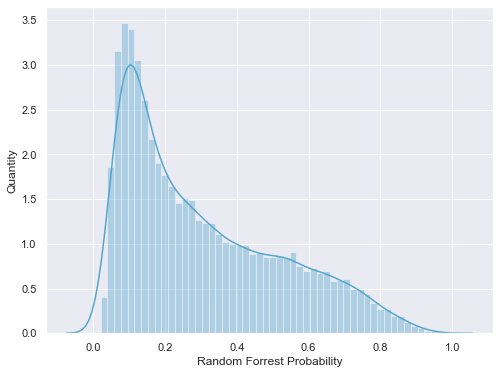

In [23]:
# Set matplotlib parameters
sns.set(rc={'figure.figsize':(8,6)})
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

# Plot and save figure
sns.distplot(prediction.loc[prediction['llps'] == 0]['mean'], bins=50, color = '#55a6cd')
plt.xlabel('Random Forrest Probability')
plt.ylabel('Quantity')
plt.draw()
plt.savefig(CWD+'\\data\\graphs\\histogram_prediction.pdf', transparent=True)
plt.show()

<h2> Top 1% predictions </h2>

In [104]:
','.join(list(prediction[0: int((len(prediction)*.015))]['uniprot_id']))

'Q99729,Q12906,O43390,O75175,Q9BYJ9,P04264,Q8ND56,Q9BUJ2,O60506,Q9HCD5,O15523,Q8NE35,Q02078,P55316,Q14444,Q9UBL0,O95104,P52756,O75190,P14866,Q15637,P35527,Q8NCA5,Q96AE4,Q7Z739,Q16630,Q14157,O14994,Q92841,Q96PV6,Q8IWX8,Q00839,Q92945,Q5BKZ1,Q9BX40,Q17RY0,Q15032,P35908,Q9NSY1,Q8TAQ2,Q9Y2K5,P02671,Q96EP5,Q92734,Q9P0K8,Q96QC0,Q6E0U4,Q9UPY6,Q7Z417,Q9ULJ6,Q92922,Q13950,Q8WWM7,O14654,P55317,O00267,O00401,Q9Y5A9,Q92997,Q5T6F2,Q96S59,Q9NYB9,Q86V81,O95429,P13645,P51116,Q9UGU0,Q3YEC7,Q12778,Q96HR8,Q9UKL0,Q8NDF8,O15234,O15504,Q96JK9,P48436,Q9ULX6,Q9Y6W5,O15265,Q9P270,Q6PJG2,O14641,Q9Y2W2,O43823,Q9UMZ2,Q99502,Q96JC9,P67809,P42568,Q8TB72,P40425,Q96EV2,Q15427,P40426,Q96QZ7,Q99856,Q96DT7,P20265,Q9UKM9,Q9NY12,O94913,P55808,Q10571,O95936,Q9H161,Q14774,Q9UPW0,O15117,Q1KMD3,O14497,Q8N684,P12035,Q9UI36,O95835,Q8NFD5,Q00577,Q99967,Q7Z7F0,Q9Y6Q9,Q9Y2J0,Q01546,O75909,Q9C0J8,Q5JVS0,Q14671,P50995,O14964,P61129,Q8IYB5,Q9NVW2,Q8N4C8,Q99457,Q9NQS1,Q7Z794,Q5TC84,O75400,P18146,Q99626,Q86XP3,Q86UL8,Q6P1L5,O15014,Q96IZ

In [24]:
prediction.loc[prediction['uniprot_id'] == 'Q14781']

,protein_name,mean,llps,uniprot_id
19576,CBX2_HUMAN,NaN,1,Q14781


<h3> Feature importances</h3>

In [12]:
def plot_feature_importance(fi_data, analysis_name):
    fi_data['mean'] = fi_data.select_dtypes([np.number]).mean(axis=1)
    fi_data = fi_data.sort_values('mean', ascending=False).reset_index(drop=True)
    fi_data[['variable', 'mean']]

    # Set matplotlib parameters
    sns.set(rc={'figure.figsize':(8,6)})
    plt.rcParams['pdf.fonttype'] = 42
    plt.rcParams['ps.fonttype'] = 42
    fi_data[0:15].plot.bar(x='variable', y='mean', rot=45, color='#CD6155')
    plt.ylabel('Fraction of impact')
    plt.xlabel('Feature')
    plt.title('Mean feature importances')
    plt.savefig(CWD+f'\\analysis\\{analysis_name}\\feature_importances.pdf', transparent=True)
    plt.show()

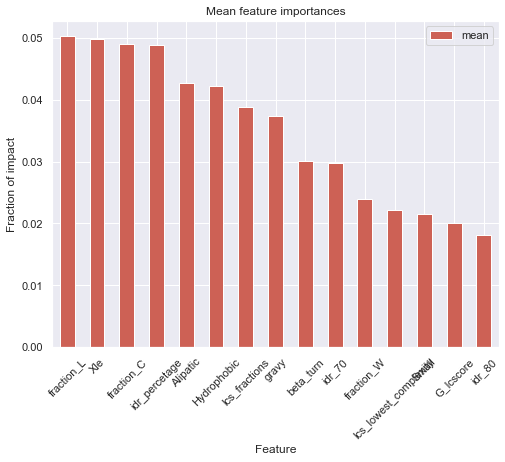

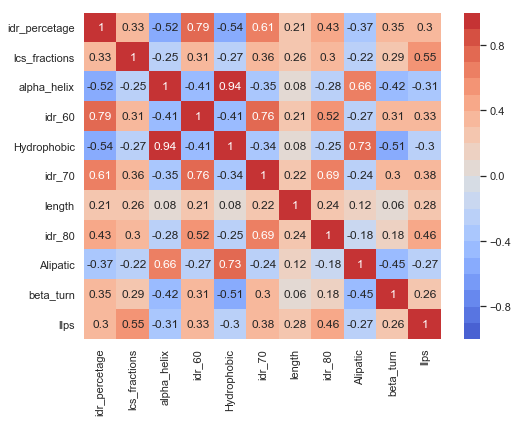

In [131]:
col_list= list(fi_data[0:10]['variable'])
col_list.append('llps')

sns.heatmap(data=processed_data[col_list].corr().round(2),
            cmap=sns.color_palette("coolwarm", 20)
            , vmin=-1,
            vmax=1,
           annot=True)
plt.show()

alpha_helix =  V, I, Y, F, W, L <br>
gravy = 'hydropathic character of a protein' https://www.ncbi.nlm.nih.gov/pubmed/7108955?dopt=Abstract

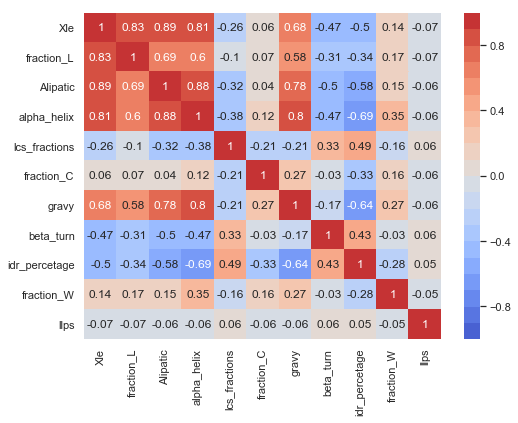

In [101]:
sns.heatmap(data=processed_data[['Xle', 
                                 'fraction_L',
                                 'Alipatic',
                                 'alpha_helix',
                                 'lcs_fractions',
                                 'fraction_C',
                                 'gravy',
                                 'beta_turn',
                                 'idr_percetage',
                                 'fraction_W',
                                 'llps'
                                ]].corr().round(2),
            cmap=sns.color_palette("coolwarm", 20)
            , vmin=-1,
            vmax=1,
           annot=True)
plt.show()

<h1>5. Visualize prediction<h1>

In [28]:
# Functions
def plot_umap(df, probability=.8, title=''):
    # Set matplotlib parameters
    sns.set(rc={'figure.figsize':(11.7,8.27),
               'axes.facecolor':'#AEB6BF',
               'figure.facecolor':'#AEB6BF'})
    plt.rcParams['pdf.fonttype'] = 42
    plt.rcParams['ps.fonttype'] = 42


    sns.scatterplot(data=df.loc[df['llps'] == 0],
                    x = 'component1',
                    y = 'component2',
                    alpha=.1,
                    color='#AEB6BF',
                    rasterized=True,
                   )
    sns.set_palette("Reds")
    sns.scatterplot(data=df.loc[df['mean'] >= probability],
                    x = 'component1',
                    y = 'component2',
                    hue='mean',
                    alpha=.3,
                    palette='Blues',
                    rasterized=True,
                    )
    sns.scatterplot(data=df.loc[df['llps'] == 1],
                    x = 'component1',
                    y = 'component2',
                    alpha = 1,
                    color = '#CD6155',   
                    )
    
    plt.title(title)
    plt.savefig(os.getcwd()+ '\\data\graphs\\6.' + title+'_'+str(probability)+'.pdf', transparent=True)
    plt.show()

<h3> UMAP </h3>

In [32]:
import umap as umap
def calculate_umap(df, raw_prediction):
    X = df.drop(['sequence', 'protein_name', 'llps'],axis=1)

    fit = umap.UMAP()
    %time u = fit.fit_transform(X)

    X_umap = pd.DataFrame(u, columns=['component1', 'component2'])
    X_umap = pd.DataFrame(X_umap, columns=['component1', 'component2'])
    X_umap['protein_name'] = df['protein_name']
    X_umap['llps'] = df.reset_index()['llps']
    X_umap['mean'] = raw_prediction['mean']

    plot_umap(X_umap, probability=.0, title='t-SNE plot prediction pdb')
    
df = processed_data.copy()
calculate_umap(df, raw_prediction)

AttributeError: module 'umap' has no attribute 'UMAP'

# Run code.

In [13]:
def predict_other_df(clf, processed_data, second_df, analysis_name):
    prediction, fi_data = predict_proteome(processed_data,
                                           clf,
                                           instance='llps',
                                           testing_size=.2,
                                           # remove_training=True,
                                           second_df=second_df,
                                          )
    prediction.to_csv(CWD+f'\\analysis\\{analysis_name}\\full_prediction.csv')




In [14]:
def main(data, instance, ANALYSIS_NAME, second_df=pd.DataFrame(), second_df_bool=False):
    # Make directory for output.
    try:
        os.mkdir(os.getcwd()+f'\\analysis\\{ANALYSIS_NAME}')
    except:
        print(f'Directory {ANALYSIS_NAME} already exists. Please choose another analysis name, or remove the directory {ANALYSIS_NAME}.')
        
    
    # Model evaluations
    evaluations = get_model_evaluations(data)
    plot_pca(data, analysis_name=ANALYSIS_NAME)
    
    evaluations = get_model_evaluations(data, ratio=1, testing_size=.1, label=instance)
    metric_df = get_classififier_scores(evaluations)
    plot_heatmap(metric_df, analysis_name=ANALYSIS_NAME)
    

    # Plot curves
    evaluation_type = 'ROC'
    aggegrate = plot_curves(evaluations, evaluation_type = evaluation_type, analysis_name=ANALYSIS_NAME)

    
    evaluation_type = 'PRC'
    plot_curves(evaluations, evaluation_type = evaluation_type, analysis_name=ANALYSIS_NAME)
    
    
    # Make prediction with random forest
    clf = RandomForestClassifier(max_depth=12, n_estimators=100)
    prediction, fi_data = predict_proteome(data, clf, instance=instance, testing_size=.2, remove_training=False)
    
    #Predict second dataset
    if second_df_bool:
        predict_other_df(clf, data, second_df, ANALYSIS_NAME)
    
    # Get Feature Importance
    plot_feature_importance(fi_data, ANALYSIS_NAME)

    # Save prediction to .csv
    prediction.to_csv(os.getcwd()+f'\\analysis\\{ANALYSIS_NAME}\\preidction_{ANALYSIS_NAME}.csv')

# Run research

(20600, 96)
Number of phase separating proteins in dataset: 91
(20600, 96)
Now training: Random Forest



Now training: Gradient Boosting



Now training: Extra Trees



Now training: Decision Tree



Now training: KNeighbors



Now training: C-Support Vector



Now training: Gaussian Process



Now training: Neural Net


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma


Now training: AdaBoost


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Now training: Gaussian Naive Bayes


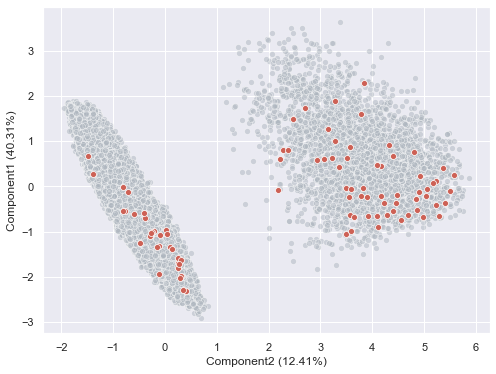

Now training: Random Forest



Now training: Gradient Boosting



Now training: Extra Trees



Now training: Decision Tree



Now training: KNeighbors



Now training: C-Support Vector



Now training: Gaussian Process



Now training: Neural Net


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma


Now training: AdaBoost


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Now training: Gaussian Naive Bayes


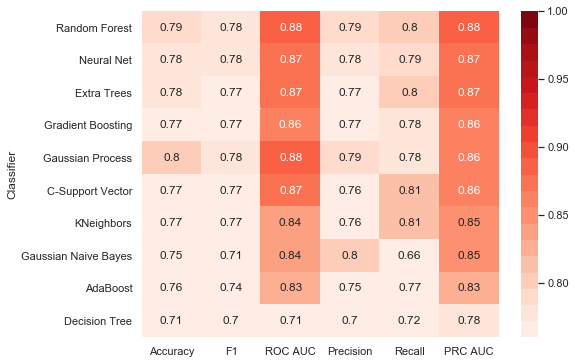

<Figure size 576x432 with 0 Axes>

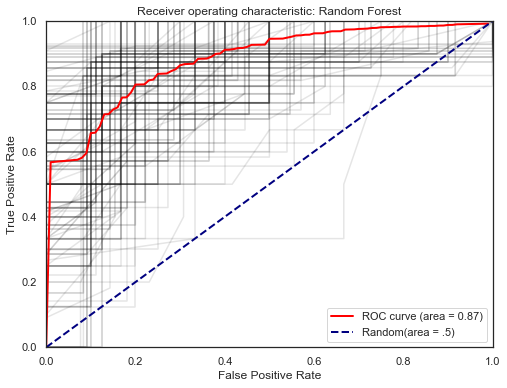

<Figure size 576x432 with 0 Axes>

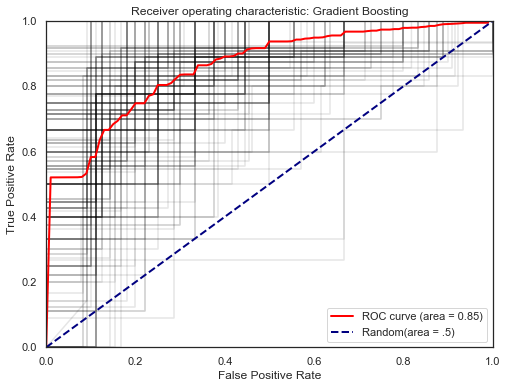

<Figure size 576x432 with 0 Axes>

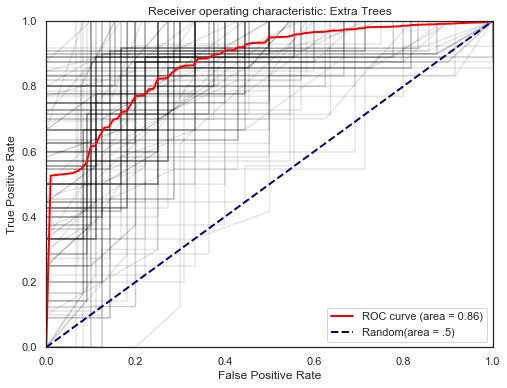

<Figure size 576x432 with 0 Axes>

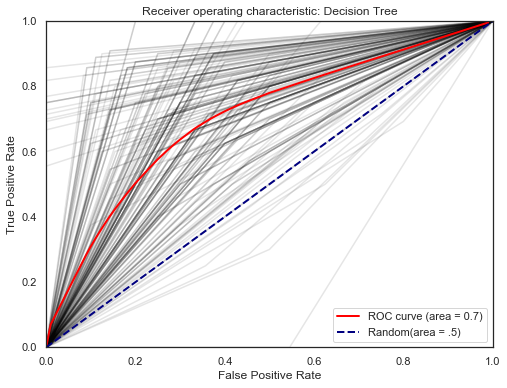

<Figure size 576x432 with 0 Axes>

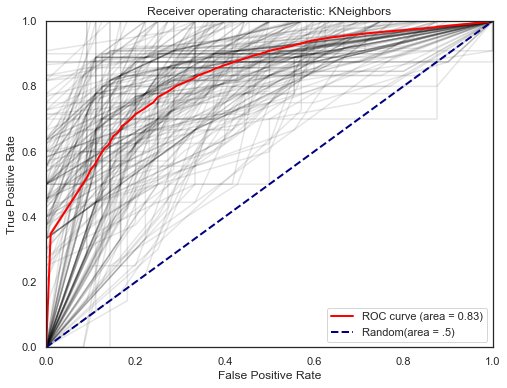

<Figure size 576x432 with 0 Axes>

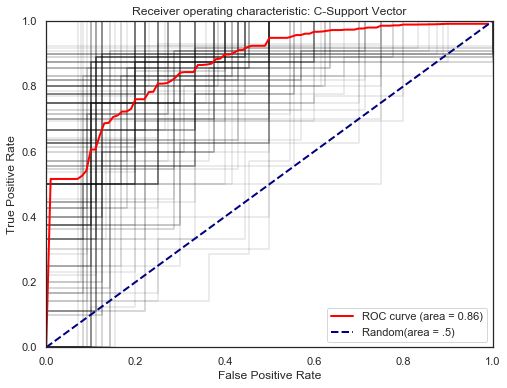

<Figure size 576x432 with 0 Axes>

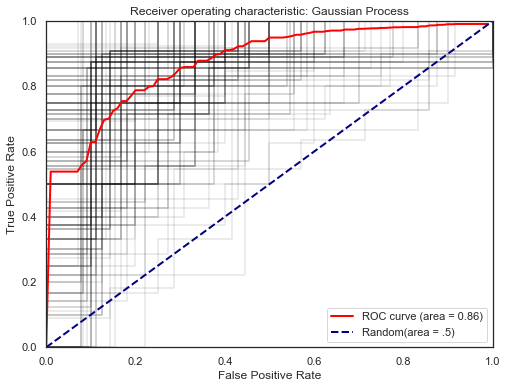

<Figure size 576x432 with 0 Axes>

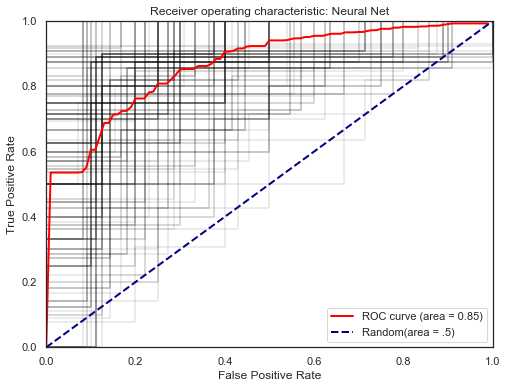

<Figure size 576x432 with 0 Axes>

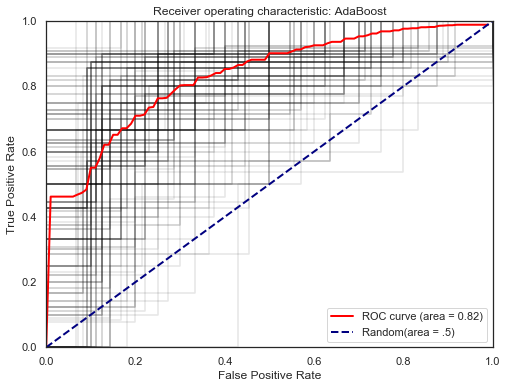

<Figure size 576x432 with 0 Axes>

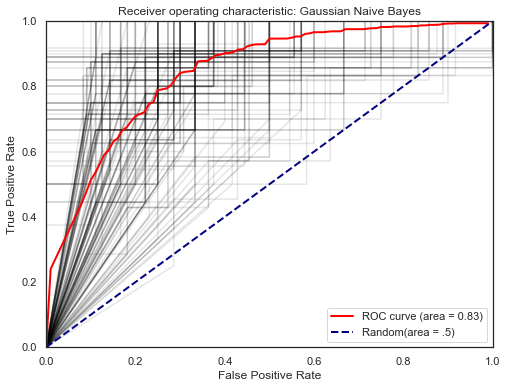

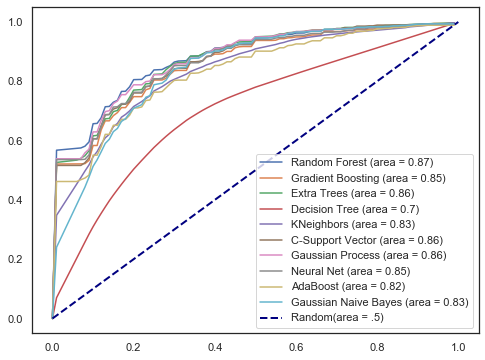

<Figure size 576x432 with 0 Axes>

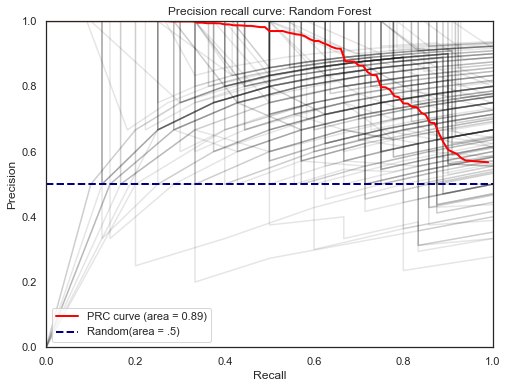

<Figure size 576x432 with 0 Axes>

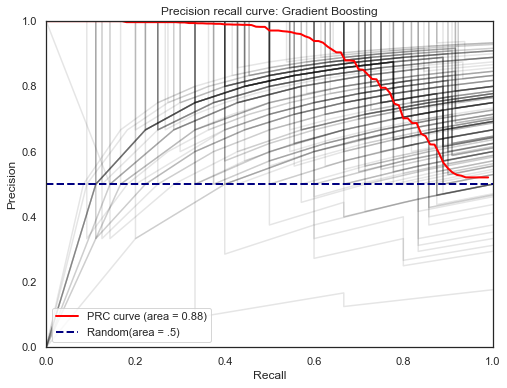

<Figure size 576x432 with 0 Axes>

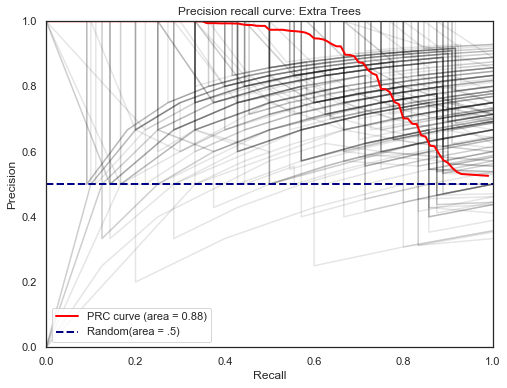

<Figure size 576x432 with 0 Axes>

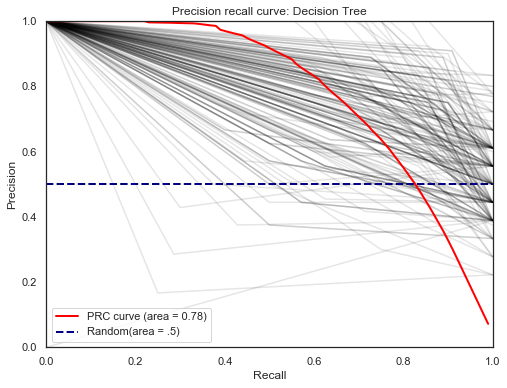

<Figure size 576x432 with 0 Axes>

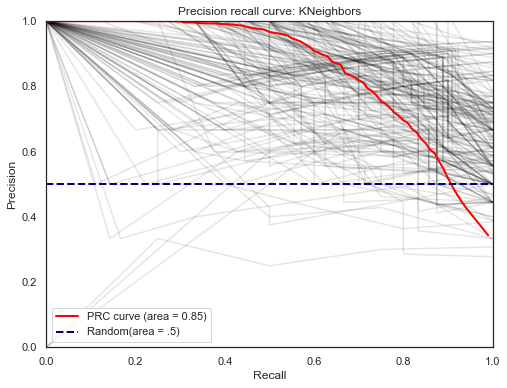

<Figure size 576x432 with 0 Axes>

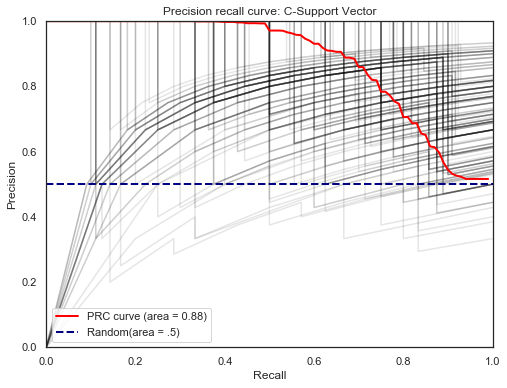

<Figure size 576x432 with 0 Axes>

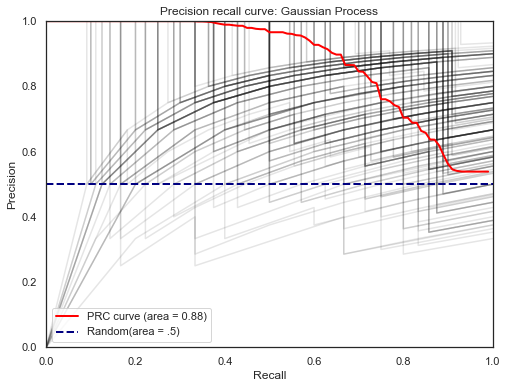

<Figure size 576x432 with 0 Axes>

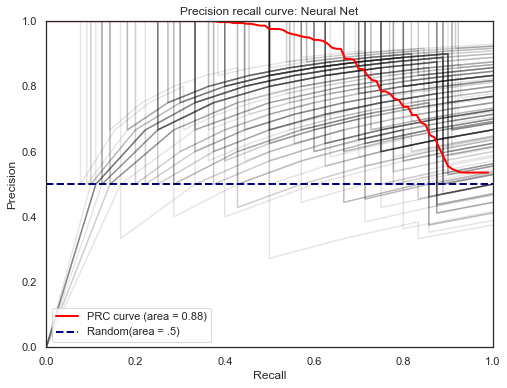

<Figure size 576x432 with 0 Axes>

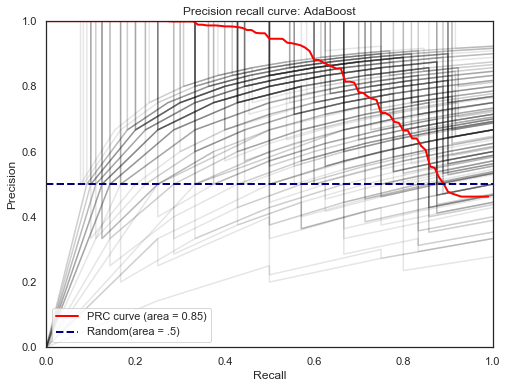

<Figure size 576x432 with 0 Axes>

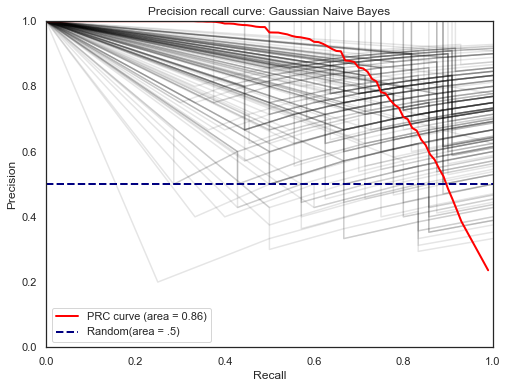

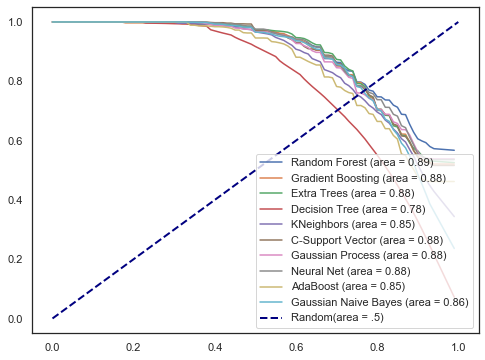

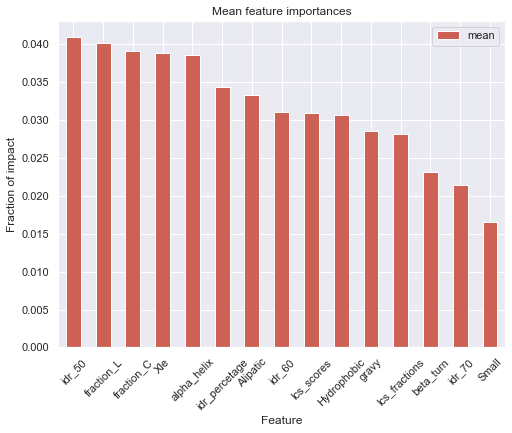

In [176]:
# Primary DF
ANALYSIS_NAME = 'human_90_240320'
path = os.getcwd()+'\\data\\dataframes\\human_90_240320.pkl'
instance = 'llps'
data = pd.read_pickle(path)
data = preprocess_and_scaledata(data)
main(data, instance, ANALYSIS_NAME)

### Load secondary DF
Use the primary DF to train the models, and predict the secondary DF.

In [16]:
# Secondary DF
path = os.getcwd()+'\\data\\dataframes\\human_90_240320.pkl'
instance = 'llps'
second_df = pd.read_pickle(path)
second_df = preprocess_and_scaledata(second_df)

(20600, 96)
Number of phase separating proteins in dataset: 91
(20600, 96)


## Run research with certain proteins removed based on SMART domains.

(20384, 96)
Number of phase separating proteins in dataset: 57
(20384, 96)
Directory delta_SM00360_SM00361 already exists. Please choose another analysis name, or remove the directory delta_SM00360_SM00361.
Now training: Random Forest



Now training: Gradient Boosting



Now training: Extra Trees



Now training: Decision Tree



Now training: KNeighbors



Now training: C-Support Vector



Now training: Gaussian Process



Now training: Neural Net


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma


Now training: AdaBoost


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Now training: Gaussian Naive Bayes


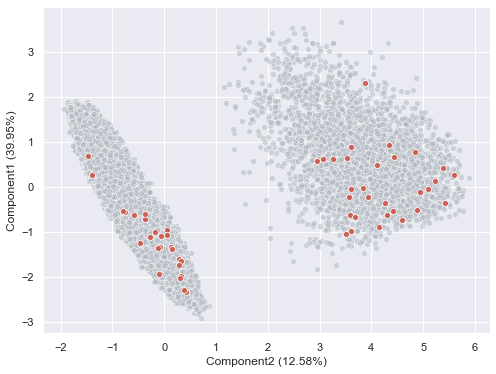

Now training: Random Forest



Now training: Gradient Boosting



Now training: Extra Trees



Now training: Decision Tree



Now training: KNeighbors



Now training: C-Support Vector



Now training: Gaussian Process



Now training: Neural Net


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma


Now training: AdaBoost


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Now training: Gaussian Naive Bayes


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


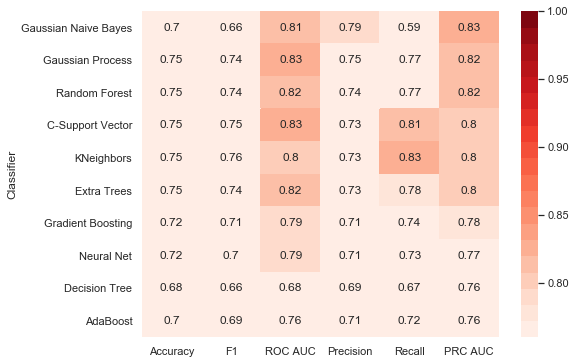

<Figure size 576x432 with 0 Axes>

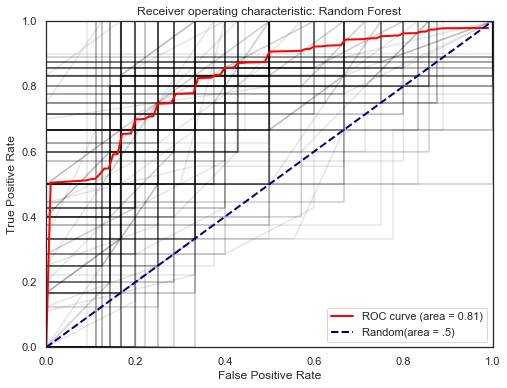

<Figure size 576x432 with 0 Axes>

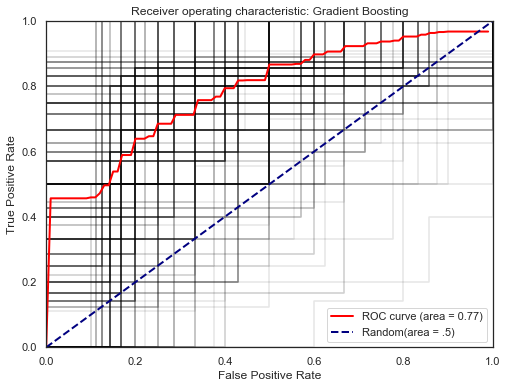

<Figure size 576x432 with 0 Axes>

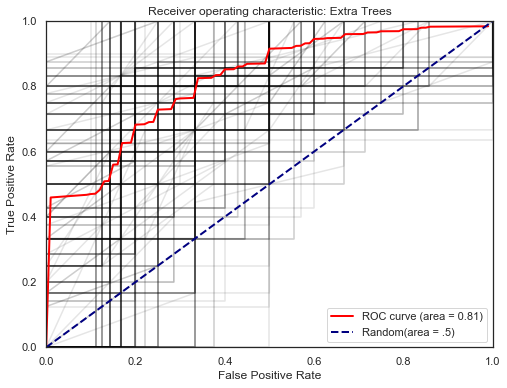

<Figure size 576x432 with 0 Axes>

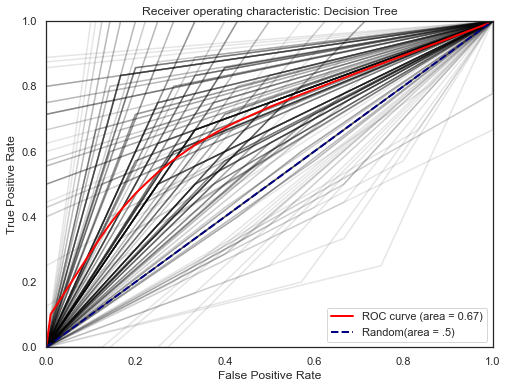

<Figure size 576x432 with 0 Axes>

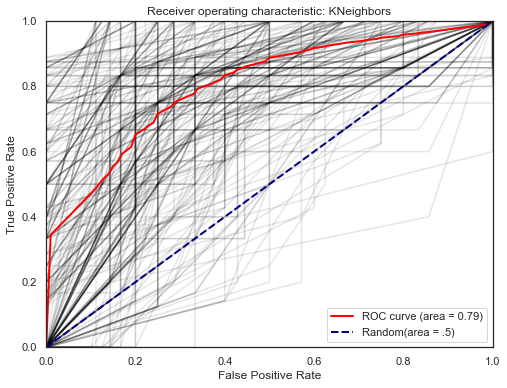

<Figure size 576x432 with 0 Axes>

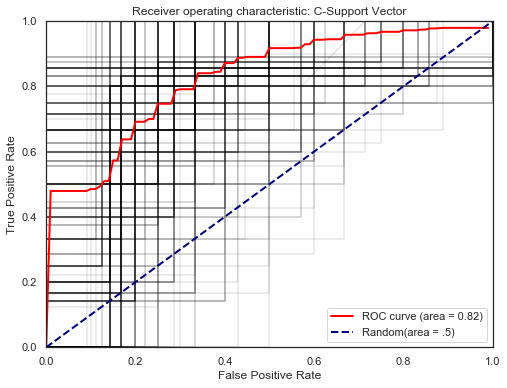

<Figure size 576x432 with 0 Axes>

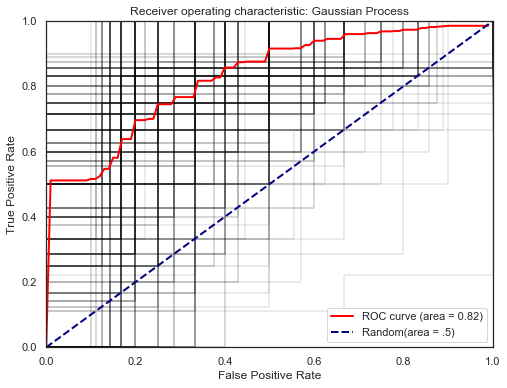

<Figure size 576x432 with 0 Axes>

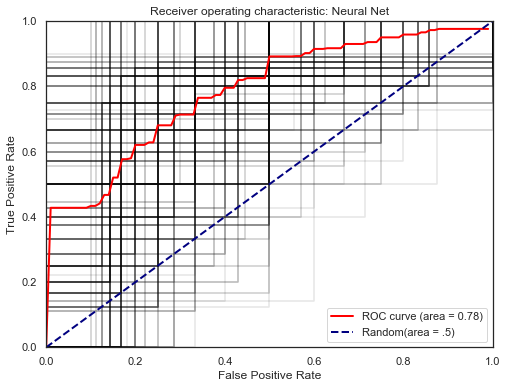

<Figure size 576x432 with 0 Axes>

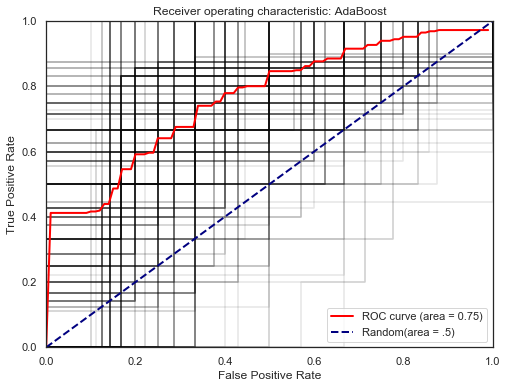

<Figure size 576x432 with 0 Axes>

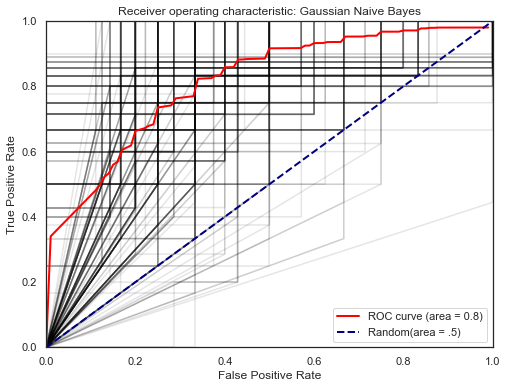

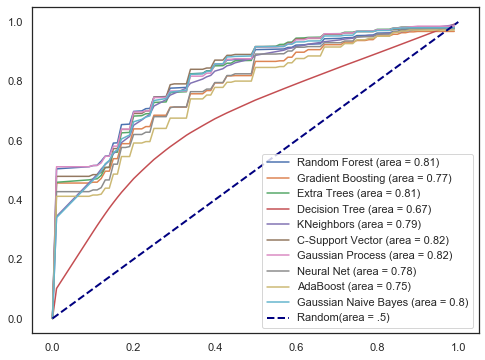

<Figure size 576x432 with 0 Axes>

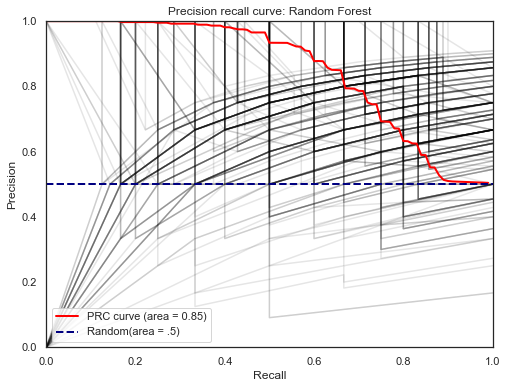

<Figure size 576x432 with 0 Axes>

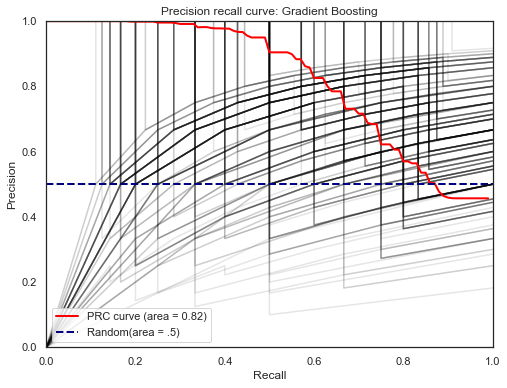

<Figure size 576x432 with 0 Axes>

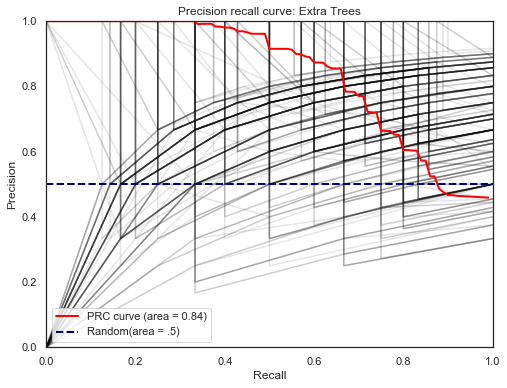

<Figure size 576x432 with 0 Axes>

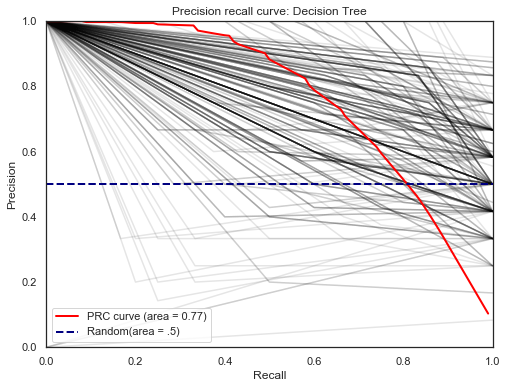

<Figure size 576x432 with 0 Axes>

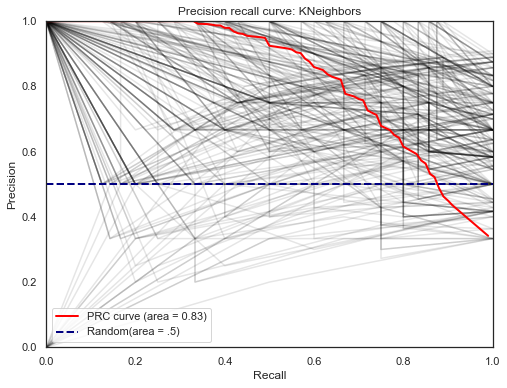

<Figure size 576x432 with 0 Axes>

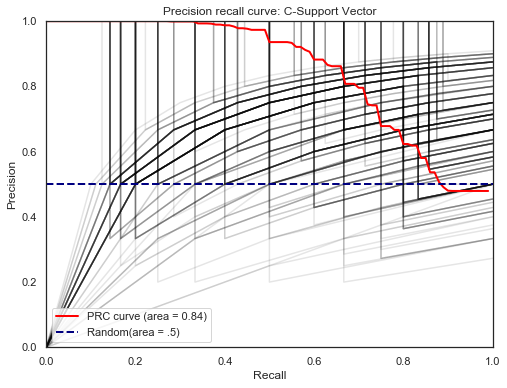

<Figure size 576x432 with 0 Axes>

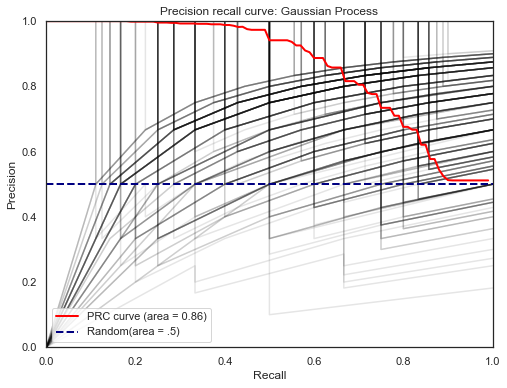

<Figure size 576x432 with 0 Axes>

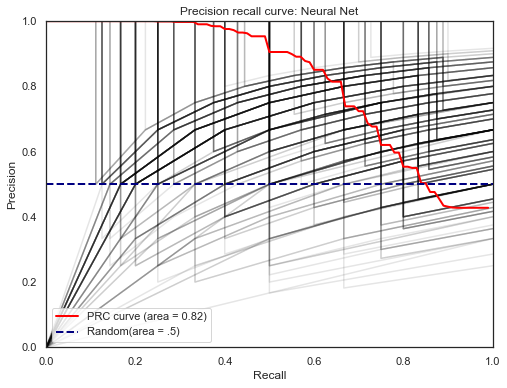

<Figure size 576x432 with 0 Axes>

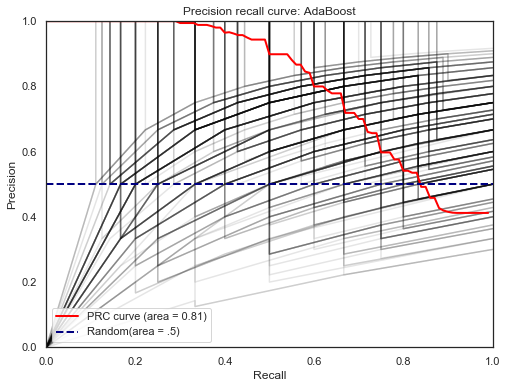

<Figure size 576x432 with 0 Axes>

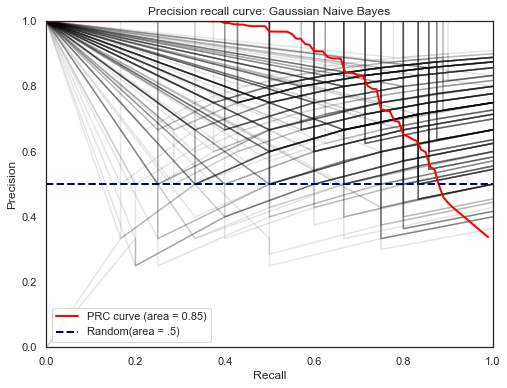

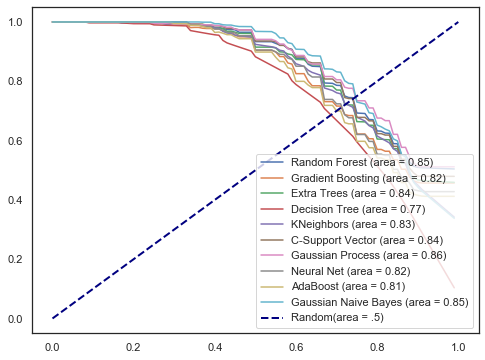

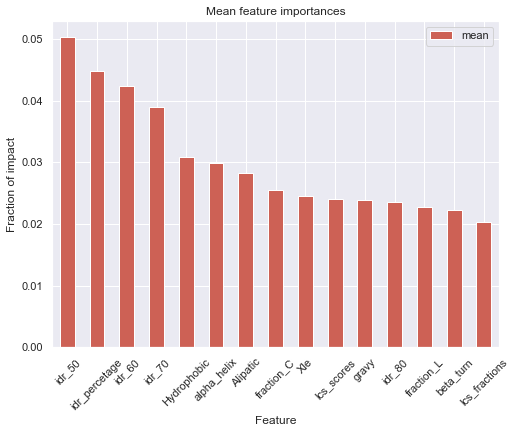

In [178]:
ANALYSIS_NAME = 'delta_SM00360_SM00361'
path = os.getcwd()+'\\data\\dataframes\\human_90_240320_delta_SM00360_SM00361.pkl'
instance = 'llps'
data = pd.read_pickle(path)
data = preprocess_and_scaledata(data)
main(data, instance, ANALYSIS_NAME, second_df, True)

(20450, 96)
Number of phase separating proteins in dataset: 88
(20450, 96)
Directory delta_SM00228 already exists. Please choose another analysis name, or remove the directory delta_SM00228.
Now training: Random Forest



Now training: Gradient Boosting



Now training: Extra Trees



Now training: Decision Tree



Now training: KNeighbors



Now training: C-Support Vector



Now training: Gaussian Process



Now training: Neural Net


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma


Now training: AdaBoost


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Now training: Gaussian Naive Bayes


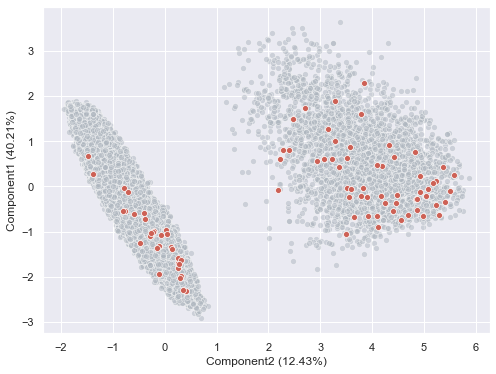

Now training: Random Forest



Now training: Gradient Boosting



Now training: Extra Trees



Now training: Decision Tree



Now training: KNeighbors



Now training: C-Support Vector



Now training: Gaussian Process



Now training: Neural Net


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma


Now training: AdaBoost


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Now training: Gaussian Naive Bayes


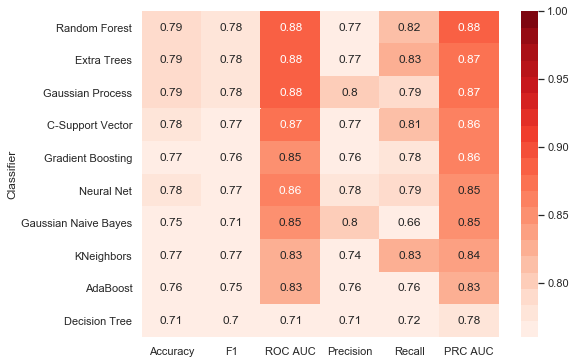

<Figure size 576x432 with 0 Axes>

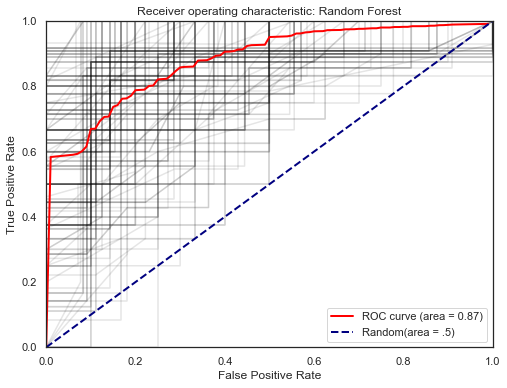

<Figure size 576x432 with 0 Axes>

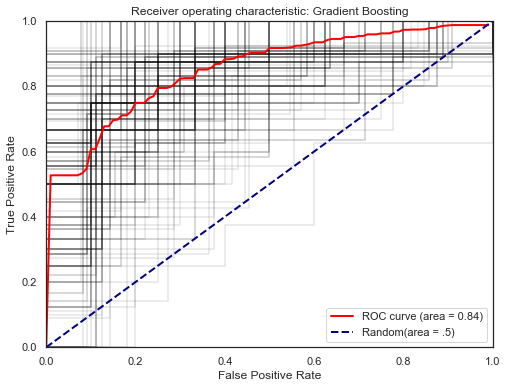

<Figure size 576x432 with 0 Axes>

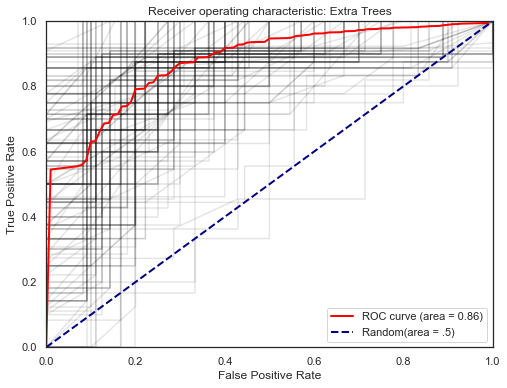

<Figure size 576x432 with 0 Axes>

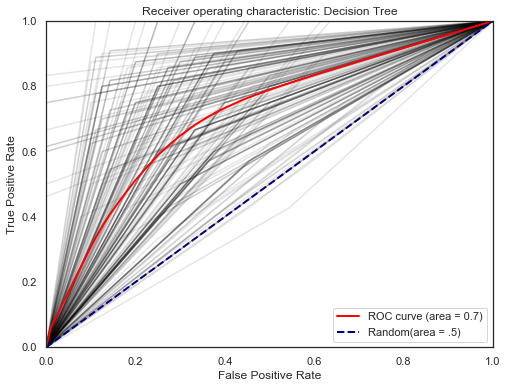

<Figure size 576x432 with 0 Axes>

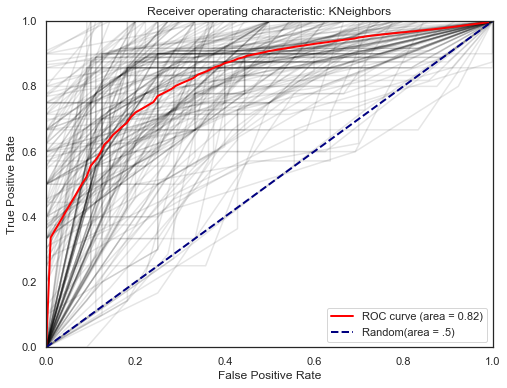

<Figure size 576x432 with 0 Axes>

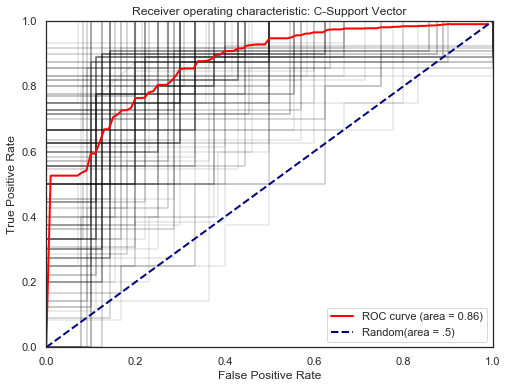

<Figure size 576x432 with 0 Axes>

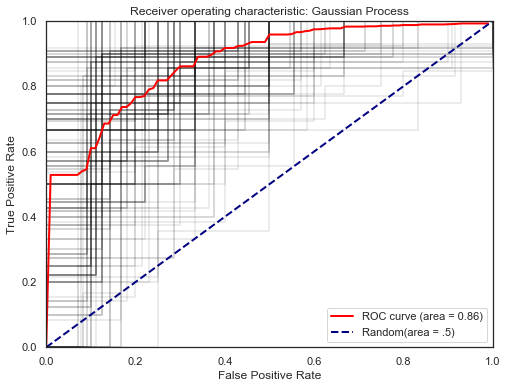

<Figure size 576x432 with 0 Axes>

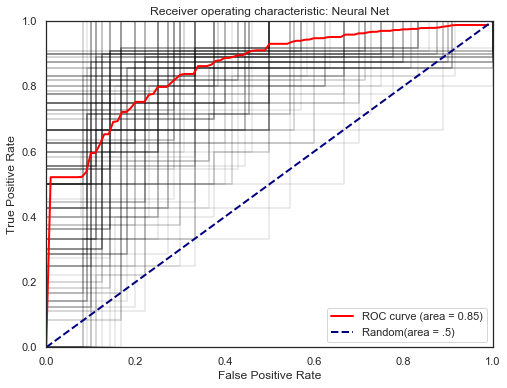

<Figure size 576x432 with 0 Axes>

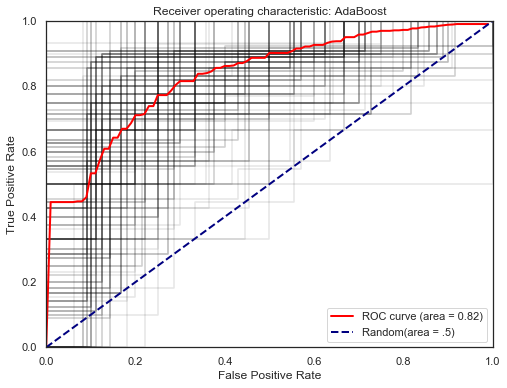

<Figure size 576x432 with 0 Axes>

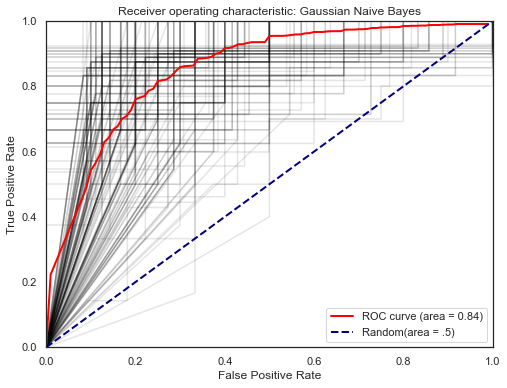

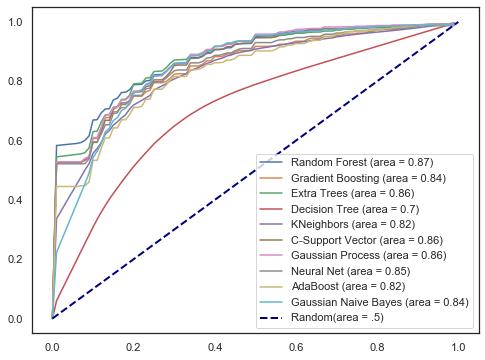

<Figure size 576x432 with 0 Axes>

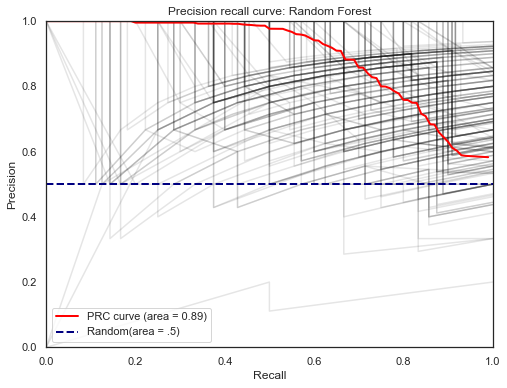

<Figure size 576x432 with 0 Axes>

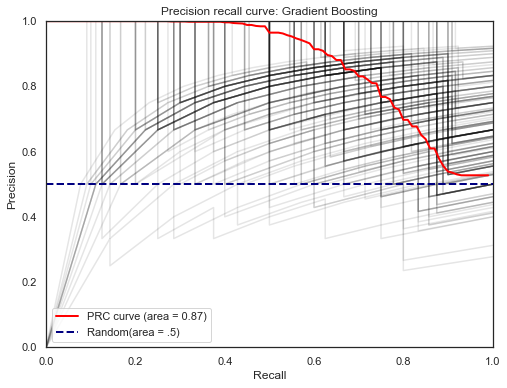

<Figure size 576x432 with 0 Axes>

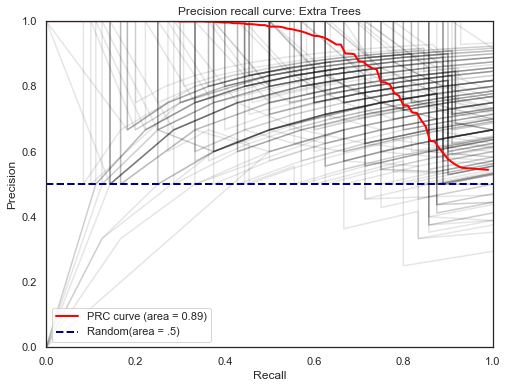

<Figure size 576x432 with 0 Axes>

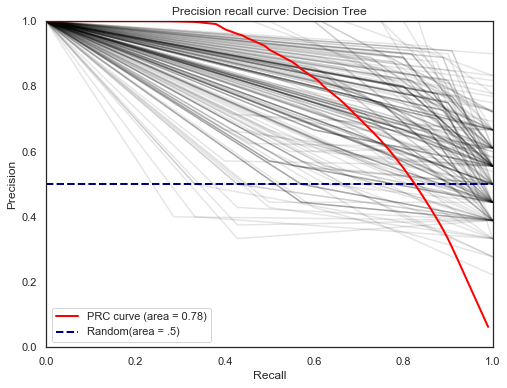

<Figure size 576x432 with 0 Axes>

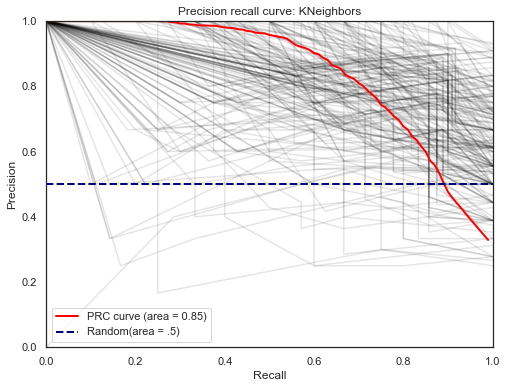

<Figure size 576x432 with 0 Axes>

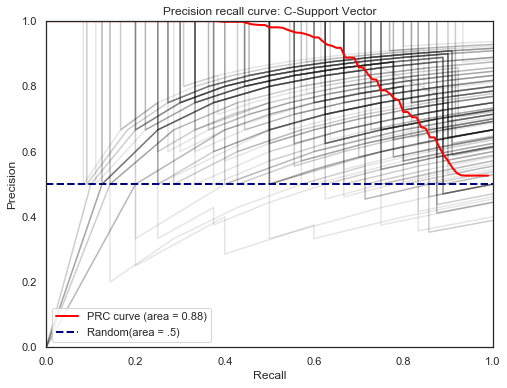

<Figure size 576x432 with 0 Axes>

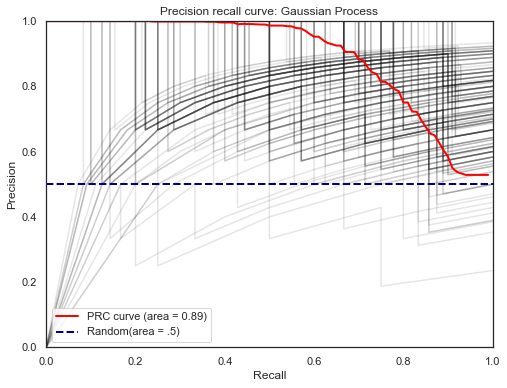

<Figure size 576x432 with 0 Axes>

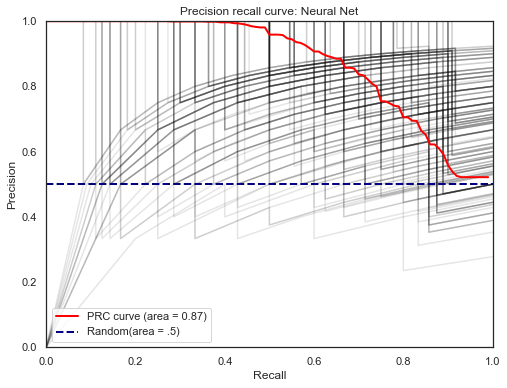

<Figure size 576x432 with 0 Axes>

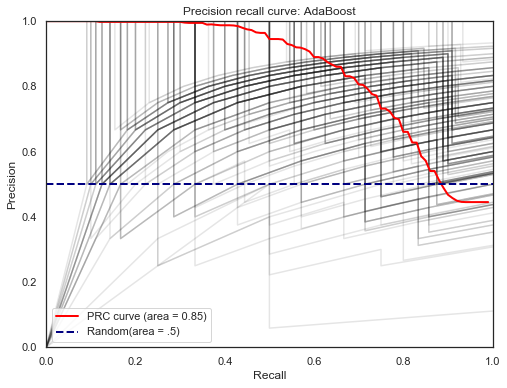

<Figure size 576x432 with 0 Axes>

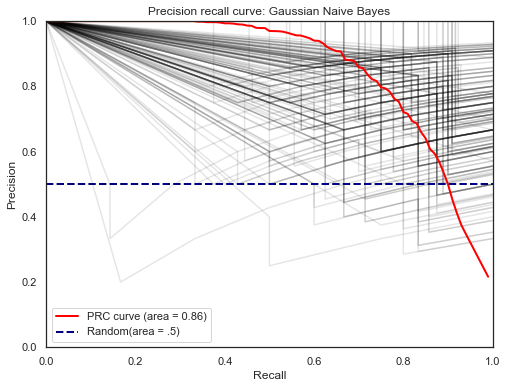

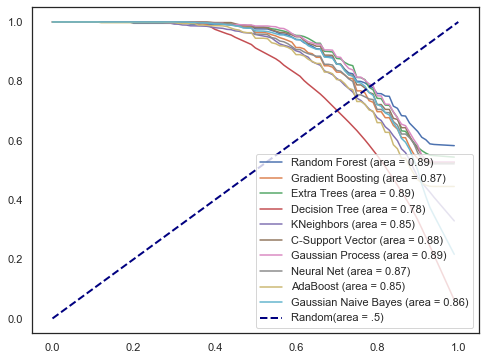

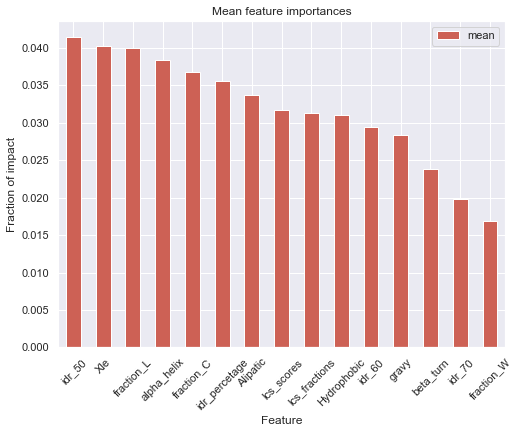

In [180]:
ANALYSIS_NAME = 'delta_SM00228'
path = os.getcwd()+'\\data\\dataframes\\human_90_240320_delta_SM00228.pkl'
instance = 'llps'
data = pd.read_pickle(path)
data = preprocess_and_scaledata(data)
main(data, instance, ANALYSIS_NAME, second_df, True)

(20566, 96)
Number of phase separating proteins in dataset: 57
(20566, 96)
Now training: Random Forest



Now training: Gradient Boosting



Now training: Extra Trees



Now training: Decision Tree



Now training: KNeighbors



Now training: C-Support Vector



Now training: Gaussian Process



Now training: Neural Net


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma


Now training: AdaBoost


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Now training: Gaussian Naive Bayes


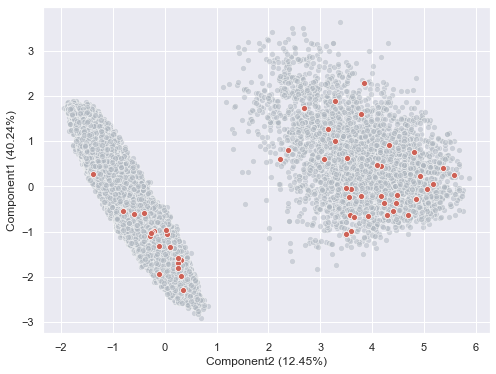

Now training: Random Forest



Now training: Gradient Boosting



Now training: Extra Trees



Now training: Decision Tree



Now training: KNeighbors



Now training: C-Support Vector



Now training: Gaussian Process



Now training: Neural Net


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma

C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.ma


Now training: AdaBoost


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:571: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  % self.max_iter, ConvergenceWarning)



Now training: Gaussian Naive Bayes


C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Jurriaan\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1272: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 due to no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


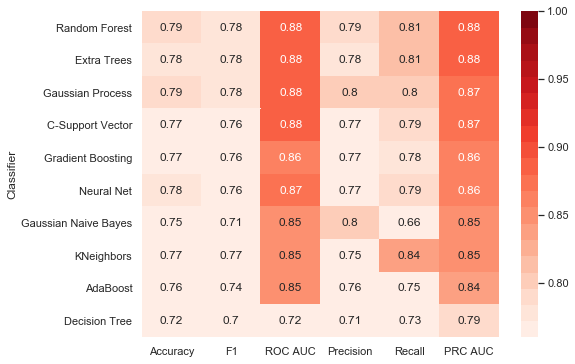

<Figure size 576x432 with 0 Axes>

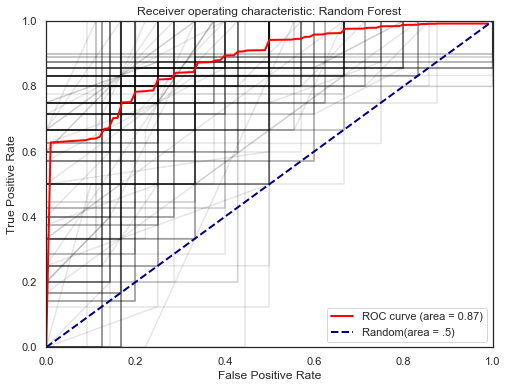

<Figure size 576x432 with 0 Axes>

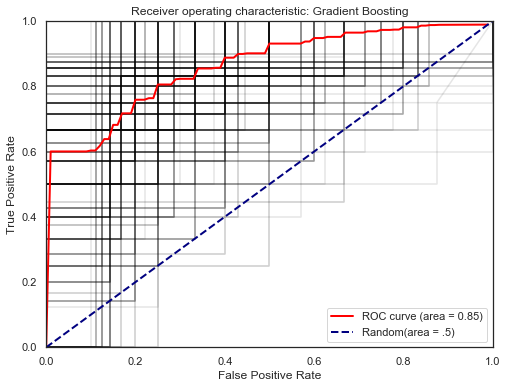

<Figure size 576x432 with 0 Axes>

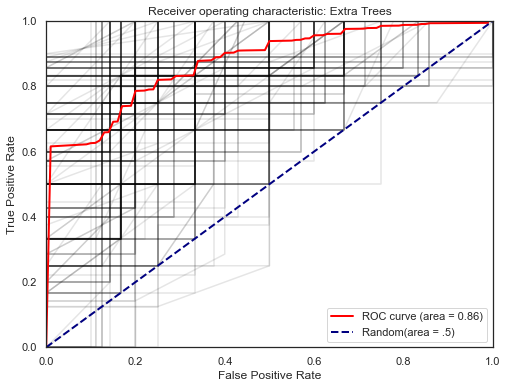

<Figure size 576x432 with 0 Axes>

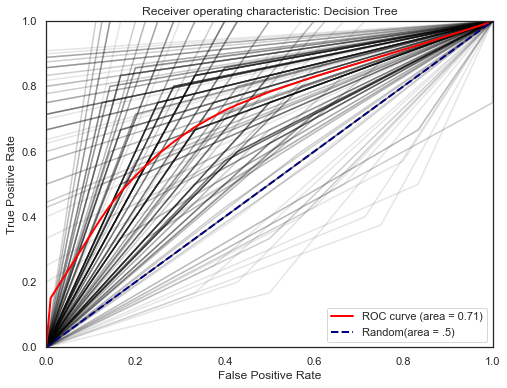

<Figure size 576x432 with 0 Axes>

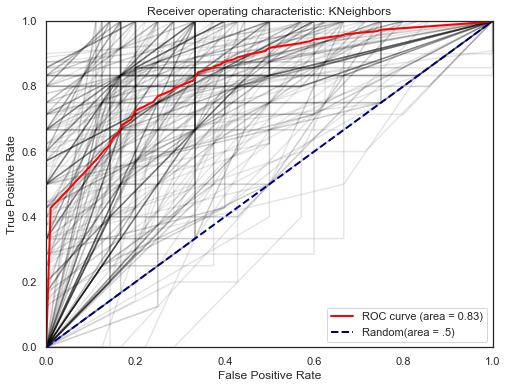

<Figure size 576x432 with 0 Axes>

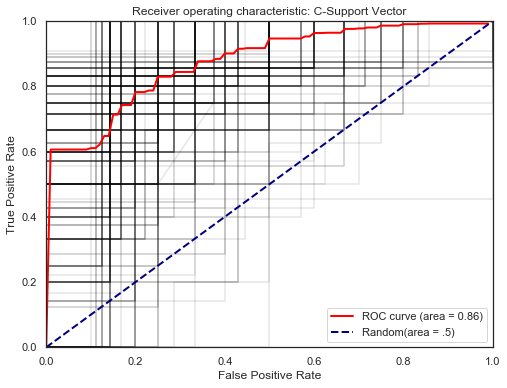

<Figure size 576x432 with 0 Axes>

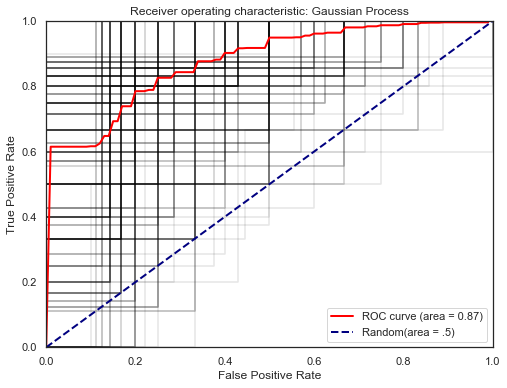

<Figure size 576x432 with 0 Axes>

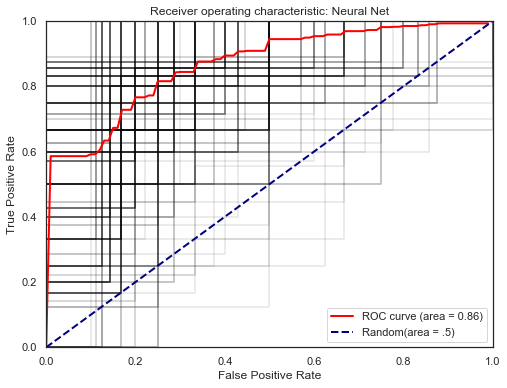

<Figure size 576x432 with 0 Axes>

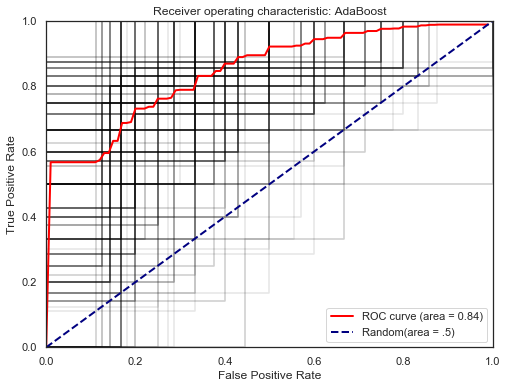

<Figure size 576x432 with 0 Axes>

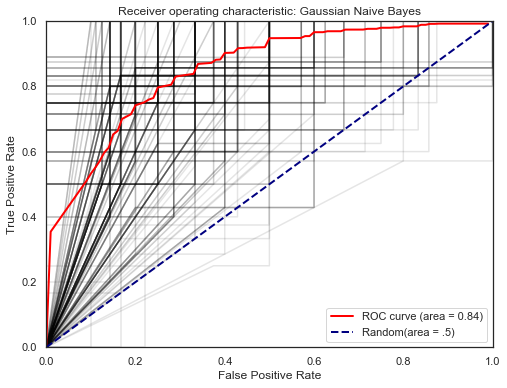

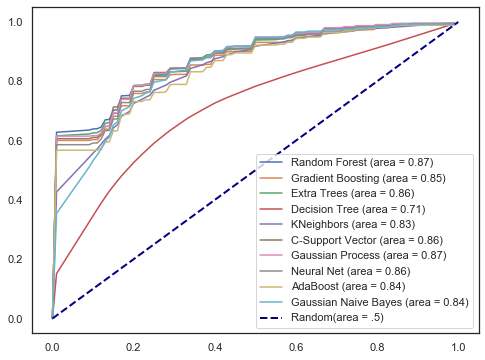

<Figure size 576x432 with 0 Axes>

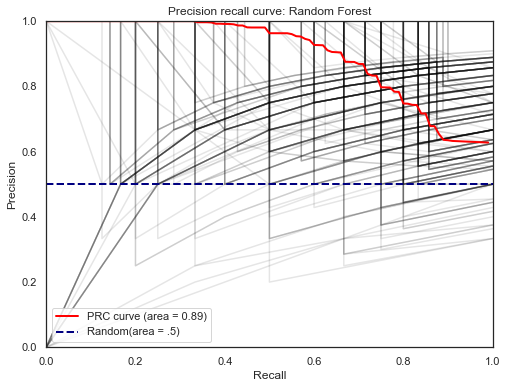

<Figure size 576x432 with 0 Axes>

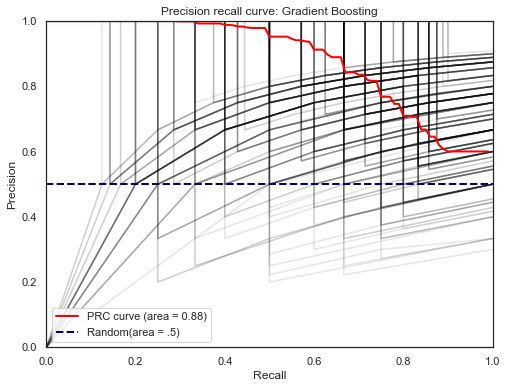

<Figure size 576x432 with 0 Axes>

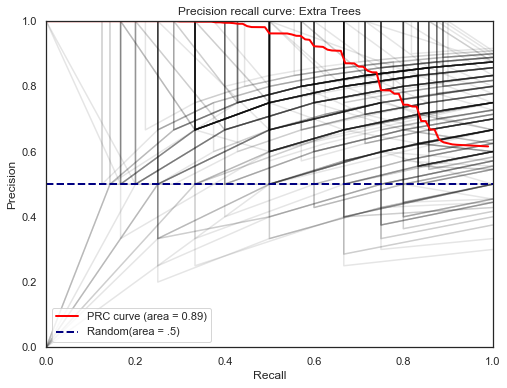

<Figure size 576x432 with 0 Axes>

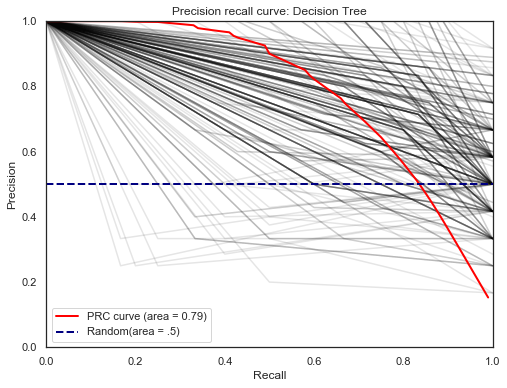

<Figure size 576x432 with 0 Axes>

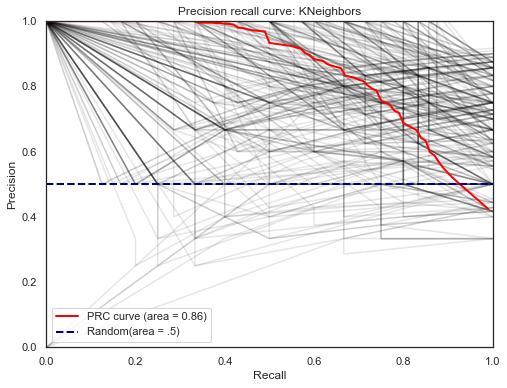

<Figure size 576x432 with 0 Axes>

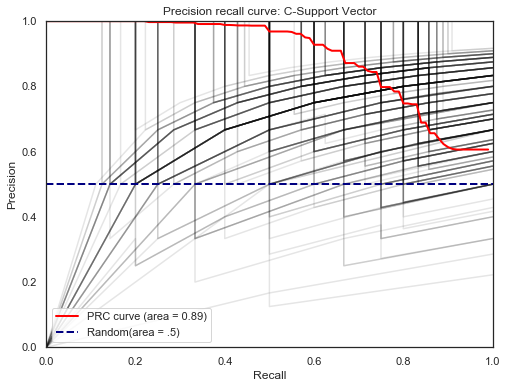

<Figure size 576x432 with 0 Axes>

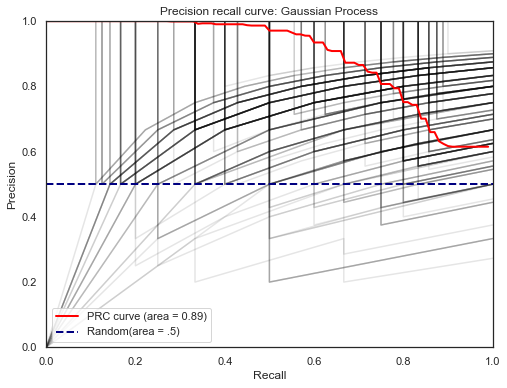

<Figure size 576x432 with 0 Axes>

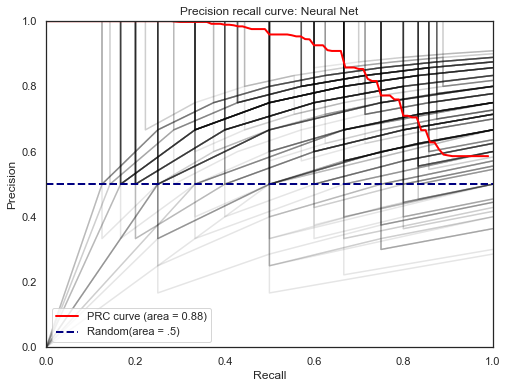

<Figure size 576x432 with 0 Axes>

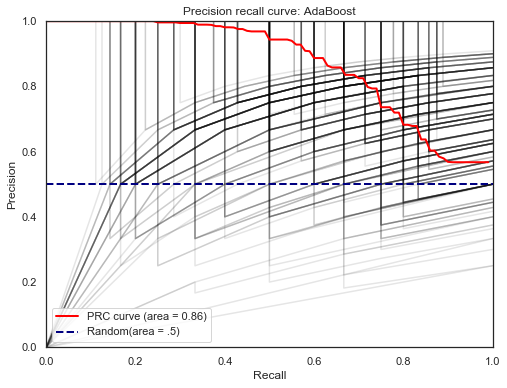

<Figure size 576x432 with 0 Axes>

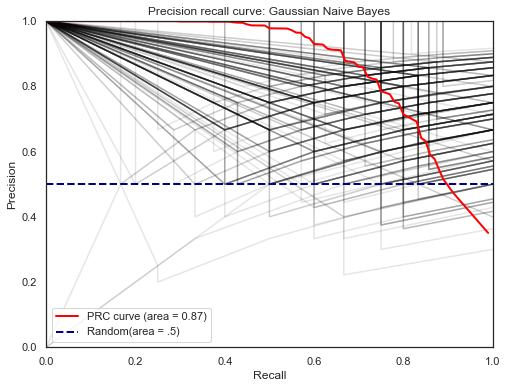

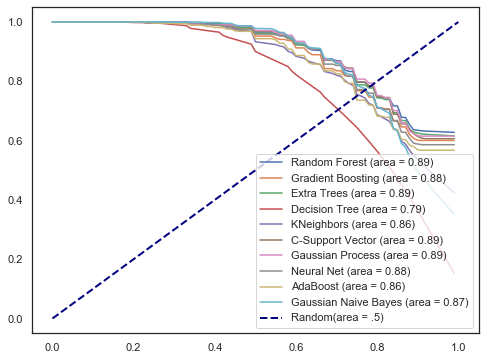

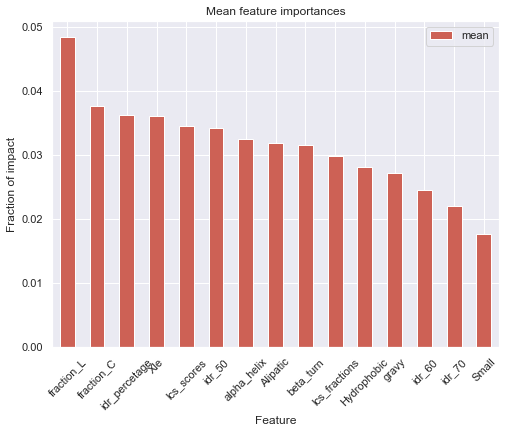

In [17]:
ANALYSIS_NAME = 'human_90_240320_delta_random_34'
path = os.getcwd()+'\\data\\dataframes\\human_90_240320_delta_random_34.pkl'
instance = 'llps'
data = pd.read_pickle(path)
data = preprocess_and_scaledata(data)
main(data, instance, ANALYSIS_NAME, second_df, True)